# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [193]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [194]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

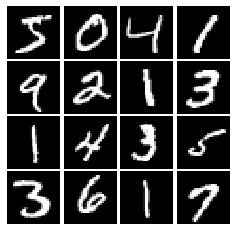

In [195]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [196]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.maximum(x, x * alpha)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [197]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [199]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

#     return tf.random.uniform(shape=(batch_size, dim))
    return tf.random.uniform(shape=(batch_size, dim), minval = -1,maxval = 1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [200]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [201]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.InputLayer(784),
        tf.keras.layers.Dense(256, input_shape=(784,), use_bias=True),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(256, use_bias=True),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(1)
        
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [202]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [203]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.InputLayer(noise_dim),
        tf.keras.layers.Dense(1024, use_bias=True, activation="relu"),
        tf.keras.layers.Dense(1024, use_bias=True, activation="relu"),
        tf.keras.layers.Dense(784, use_bias=True, activation="tanh")
        
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [204]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [205]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    N_real = logits_real.shape[0]
    N_fake = logits_fake.shape[0]    
    d_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    loss = d_loss(tf.ones(N_real), logits_real)
    loss += d_loss(tf.zeros(N_fake), logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    N_fake = logits_fake.shape[0]
    d_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    loss = d_loss(tf.ones(N_fake), logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [206]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [207]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [208]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.optimizers.Adam(learning_rate, beta1)
    G_solver = tf.optimizers.Adam(learning_rate, beta1)
    
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [209]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.341, G:0.6936


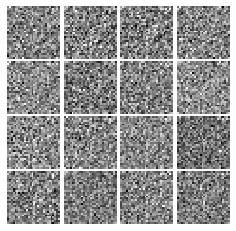

Epoch: 0, Iter: 20, D: 0.5973, G:0.9395


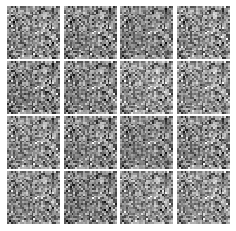

Epoch: 0, Iter: 40, D: 0.7183, G:1.421


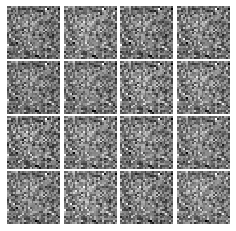

Epoch: 0, Iter: 60, D: 1.382, G:0.7352


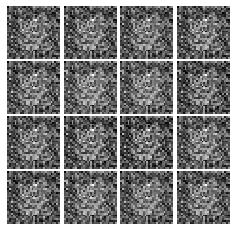

Epoch: 0, Iter: 80, D: 1.377, G:1.445


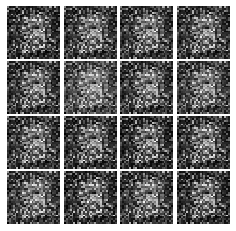

Epoch: 0, Iter: 100, D: 1.79, G:1.456


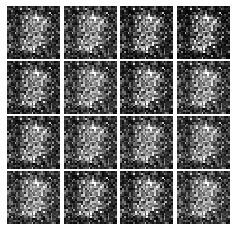

Epoch: 0, Iter: 120, D: 1.335, G:1.928


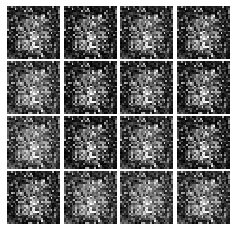

Epoch: 0, Iter: 140, D: 1.695, G:0.7396


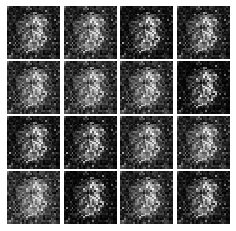

Epoch: 0, Iter: 160, D: 1.35, G:0.904


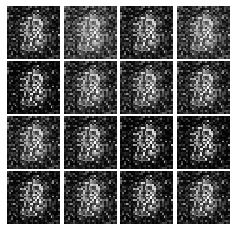

Epoch: 0, Iter: 180, D: 1.231, G:1.765


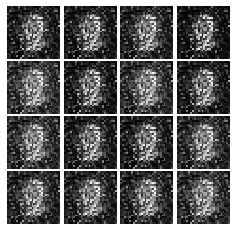

Epoch: 0, Iter: 200, D: 1.083, G:1.582


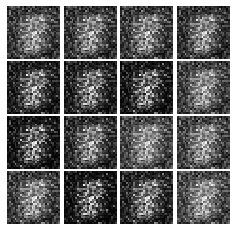

Epoch: 0, Iter: 220, D: 0.9326, G:2.372


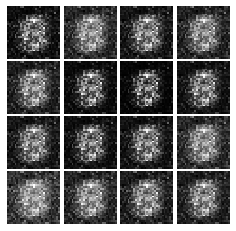

Epoch: 0, Iter: 240, D: 0.8918, G:2.191


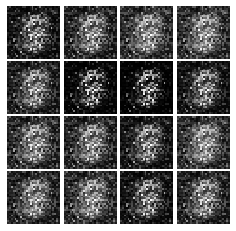

Epoch: 0, Iter: 260, D: 0.9886, G:1.426


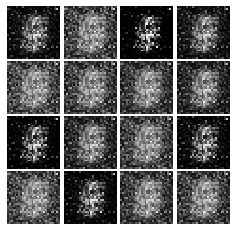

Epoch: 0, Iter: 280, D: 1.077, G:2.168


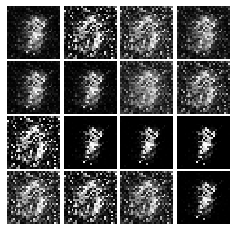

Epoch: 0, Iter: 300, D: 0.7966, G:1.69


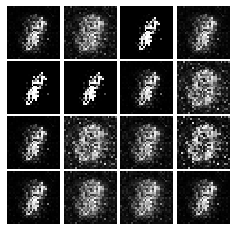

Epoch: 0, Iter: 320, D: 0.8442, G:1.362


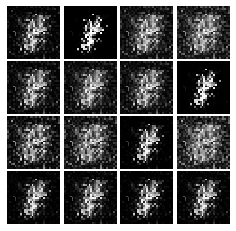

Epoch: 0, Iter: 340, D: 2.351, G:3.267


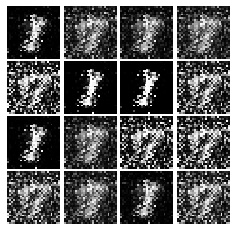

Epoch: 0, Iter: 360, D: 1.063, G:1.645


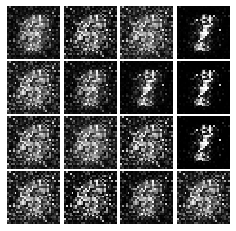

Epoch: 0, Iter: 380, D: 0.8281, G:2.024


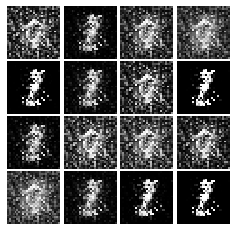

Epoch: 0, Iter: 400, D: 0.8091, G:1.627


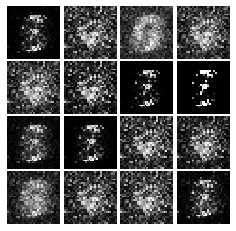

Epoch: 0, Iter: 420, D: 3.075, G:2.484


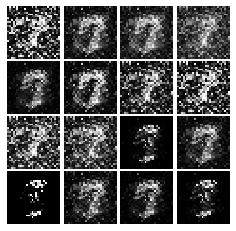

Epoch: 0, Iter: 440, D: 1.175, G:1.396


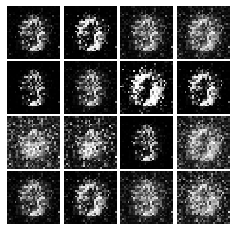

Epoch: 0, Iter: 460, D: 1.016, G:1.575


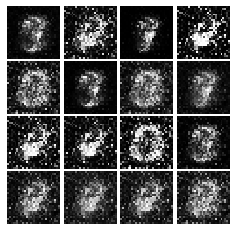

Epoch: 1, Iter: 480, D: 1.169, G:1.351


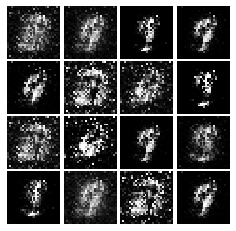

Epoch: 1, Iter: 500, D: 0.9503, G:1.821


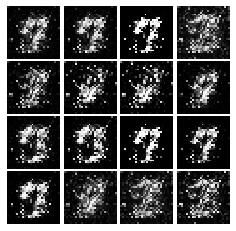

Epoch: 1, Iter: 520, D: 1.109, G:1.535


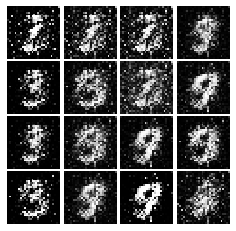

Epoch: 1, Iter: 540, D: 1.477, G:1.192


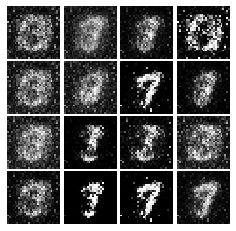

Epoch: 1, Iter: 560, D: 1.298, G:1.061


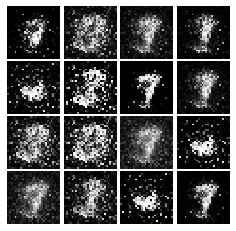

Epoch: 1, Iter: 580, D: 1.112, G:1.385


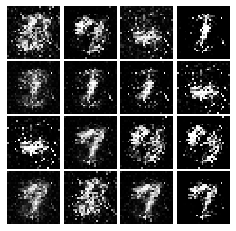

Epoch: 1, Iter: 600, D: 1.268, G:0.9438


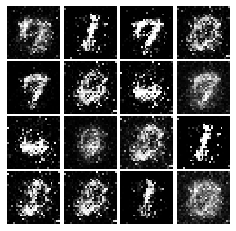

Epoch: 1, Iter: 620, D: 0.9581, G:1.378


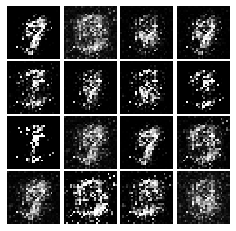

Epoch: 1, Iter: 640, D: 1.095, G:1.274


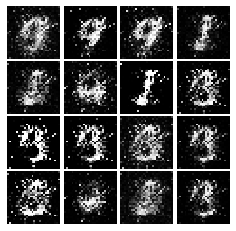

Epoch: 1, Iter: 660, D: 1.087, G:3.275


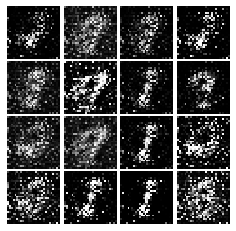

Epoch: 1, Iter: 680, D: 1.158, G:1.24


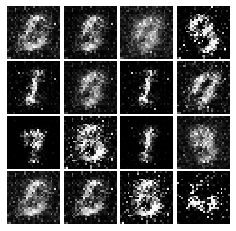

Epoch: 1, Iter: 700, D: 1.131, G:1.604


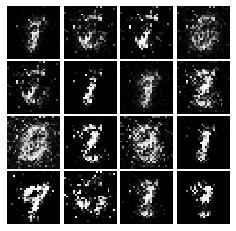

Epoch: 1, Iter: 720, D: 1.066, G:1.332


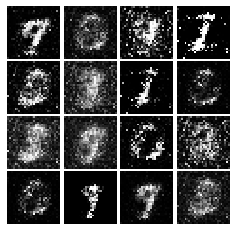

Epoch: 1, Iter: 740, D: 0.9724, G:1.472


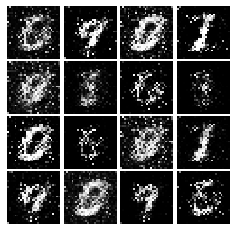

Epoch: 1, Iter: 760, D: 1.236, G:0.4651


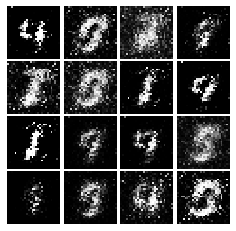

Epoch: 1, Iter: 780, D: 1.29, G:0.737


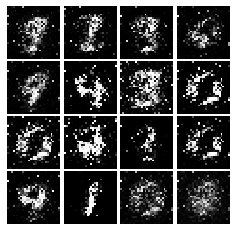

Epoch: 1, Iter: 800, D: 1.356, G:0.428


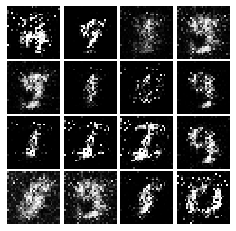

Epoch: 1, Iter: 820, D: 1.207, G:1.175


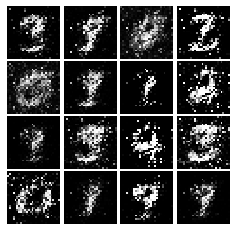

Epoch: 1, Iter: 840, D: 1.056, G:1.154


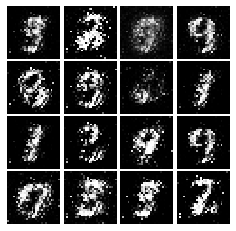

Epoch: 1, Iter: 860, D: 1.057, G:1.196


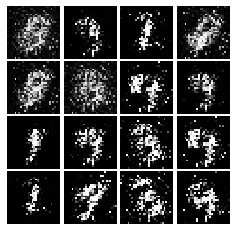

Epoch: 1, Iter: 880, D: 1.203, G:1.245


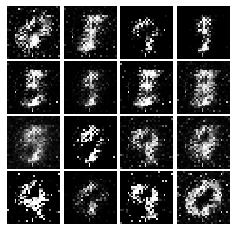

Epoch: 1, Iter: 900, D: 1.164, G:1.087


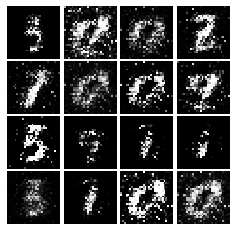

Epoch: 1, Iter: 920, D: 1.219, G:1.122


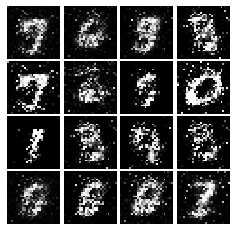

Epoch: 2, Iter: 940, D: 1.169, G:1.373


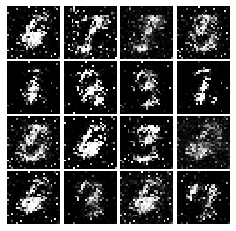

Epoch: 2, Iter: 960, D: 1.194, G:0.6817


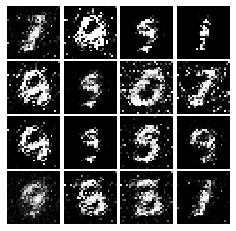

Epoch: 2, Iter: 980, D: 1.481, G:1.098


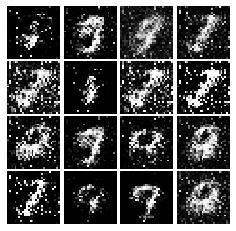

Epoch: 2, Iter: 1000, D: 1.132, G:1.17


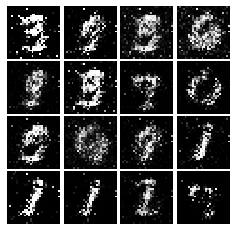

Epoch: 2, Iter: 1020, D: 1.216, G:1.262


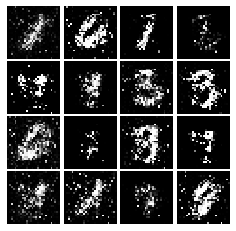

Epoch: 2, Iter: 1040, D: 1.419, G:0.7911


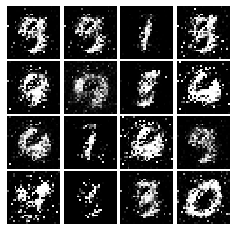

Epoch: 2, Iter: 1060, D: 1.056, G:0.977


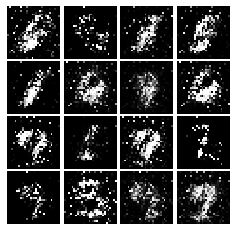

Epoch: 2, Iter: 1080, D: 1.224, G:1.197


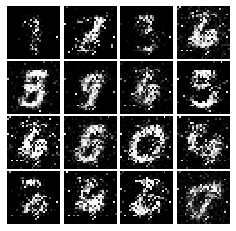

Epoch: 2, Iter: 1100, D: 1.181, G:1.189


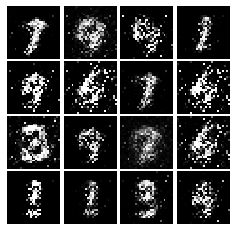

Epoch: 2, Iter: 1120, D: 1.309, G:1.492


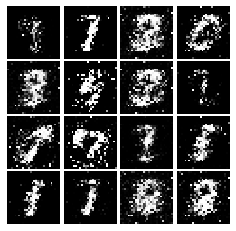

Epoch: 2, Iter: 1140, D: 1.203, G:1.763


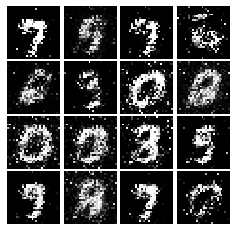

Epoch: 2, Iter: 1160, D: 1.048, G:1.191


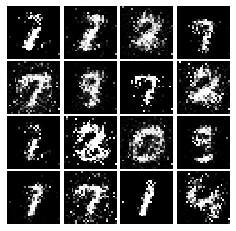

Epoch: 2, Iter: 1180, D: 1.277, G:1.043


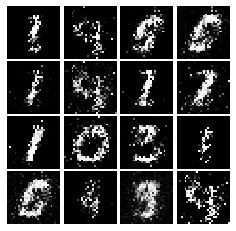

Epoch: 2, Iter: 1200, D: 1.213, G:1.145


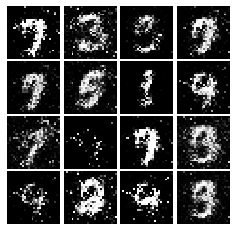

Epoch: 2, Iter: 1220, D: 1.201, G:1.07


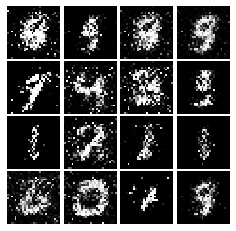

Epoch: 2, Iter: 1240, D: 1.089, G:1.029


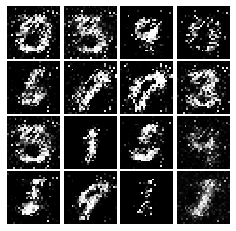

Epoch: 2, Iter: 1260, D: 1.349, G:1.915


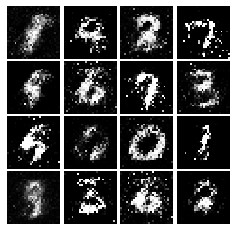

Epoch: 2, Iter: 1280, D: 1.309, G:0.8271


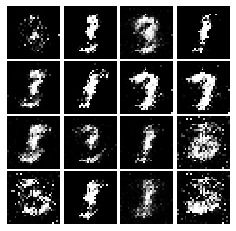

Epoch: 2, Iter: 1300, D: 1.311, G:0.9453


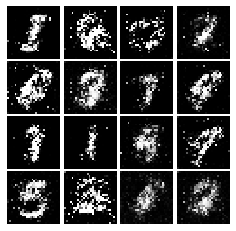

Epoch: 2, Iter: 1320, D: 1.233, G:1.182


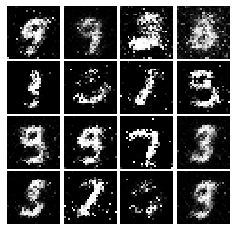

Epoch: 2, Iter: 1340, D: 1.195, G:1.166


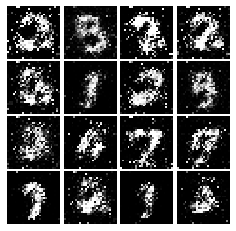

Epoch: 2, Iter: 1360, D: 1.19, G:1.1


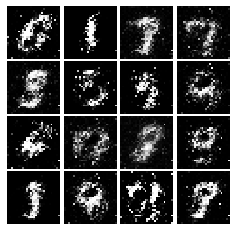

Epoch: 2, Iter: 1380, D: 1.189, G:1.36


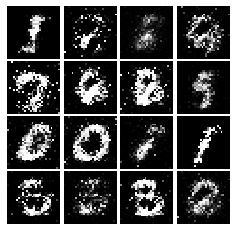

Epoch: 2, Iter: 1400, D: 1.174, G:1.083


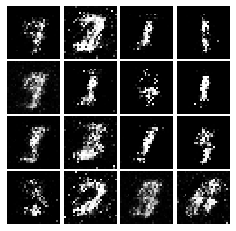

Epoch: 3, Iter: 1420, D: 1.126, G:1.08


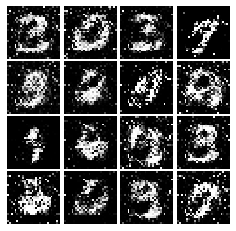

Epoch: 3, Iter: 1440, D: 1.286, G:0.895


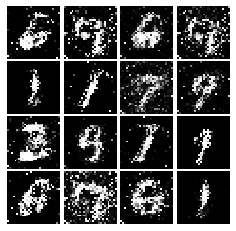

Epoch: 3, Iter: 1460, D: 1.284, G:1.009


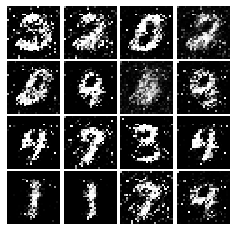

Epoch: 3, Iter: 1480, D: 1.199, G:0.8818


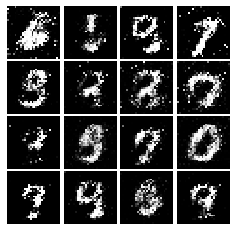

Epoch: 3, Iter: 1500, D: 1.336, G:0.9759


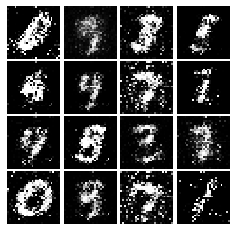

Epoch: 3, Iter: 1520, D: 1.263, G:1.336


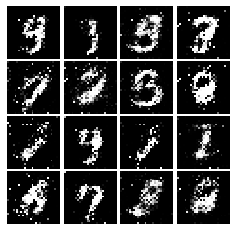

Epoch: 3, Iter: 1540, D: 1.223, G:1.079


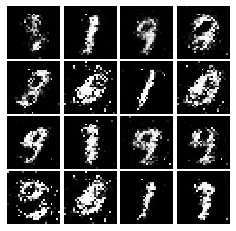

Epoch: 3, Iter: 1560, D: 1.381, G:1.083


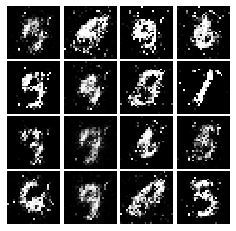

Epoch: 3, Iter: 1580, D: 1.237, G:0.9922


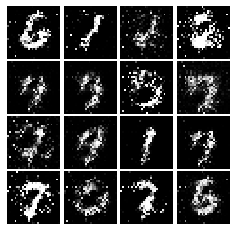

Epoch: 3, Iter: 1600, D: 1.14, G:0.763


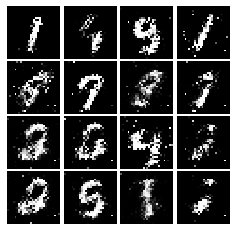

Epoch: 3, Iter: 1620, D: 1.13, G:0.9633


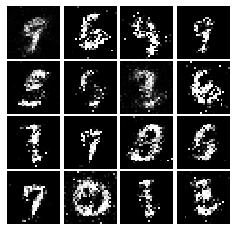

Epoch: 3, Iter: 1640, D: 1.332, G:0.8727


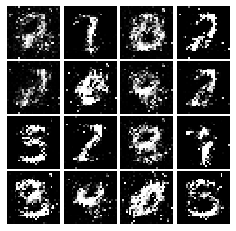

Epoch: 3, Iter: 1660, D: 1.135, G:1.084


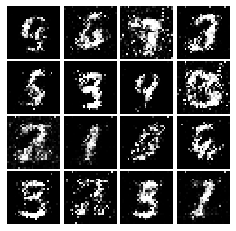

Epoch: 3, Iter: 1680, D: 1.236, G:0.9078


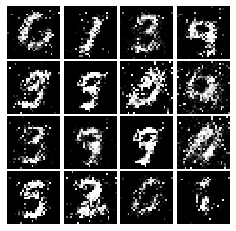

Epoch: 3, Iter: 1700, D: 1.121, G:1.175


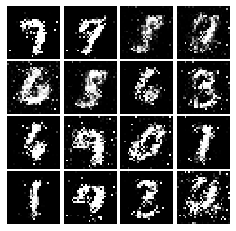

Epoch: 3, Iter: 1720, D: 1.411, G:0.981


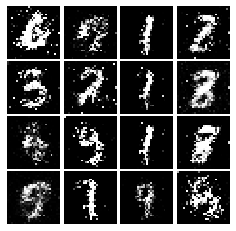

Epoch: 3, Iter: 1740, D: 1.387, G:0.853


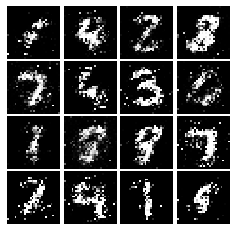

Epoch: 3, Iter: 1760, D: 1.287, G:1.037


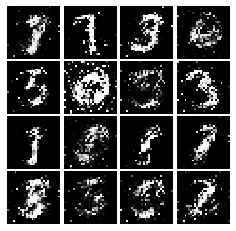

Epoch: 3, Iter: 1780, D: 1.187, G:0.9275


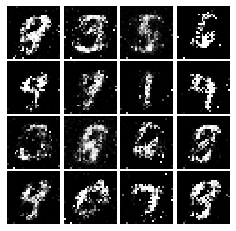

Epoch: 3, Iter: 1800, D: 1.288, G:0.9662


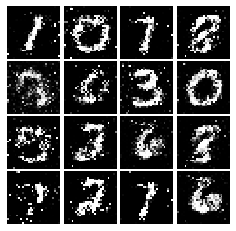

Epoch: 3, Iter: 1820, D: 1.229, G:0.8441


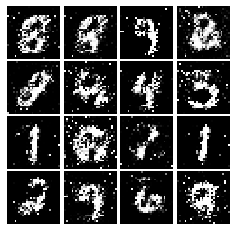

Epoch: 3, Iter: 1840, D: 1.211, G:0.9172


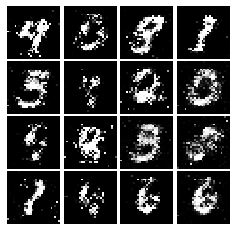

Epoch: 3, Iter: 1860, D: 1.246, G:0.967


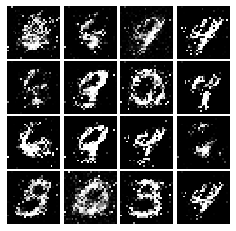

Epoch: 4, Iter: 1880, D: 1.298, G:1.052


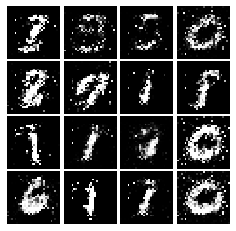

Epoch: 4, Iter: 1900, D: 1.255, G:0.8899


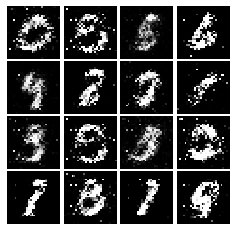

Epoch: 4, Iter: 1920, D: 1.241, G:1.168


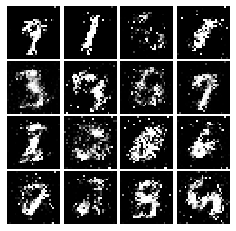

Epoch: 4, Iter: 1940, D: 1.221, G:1.05


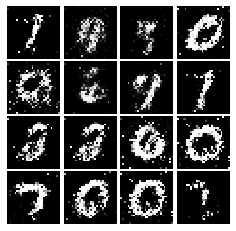

Epoch: 4, Iter: 1960, D: 1.254, G:0.95


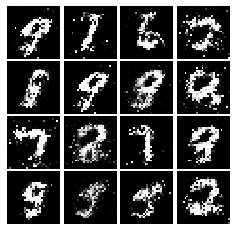

Epoch: 4, Iter: 1980, D: 1.233, G:0.972


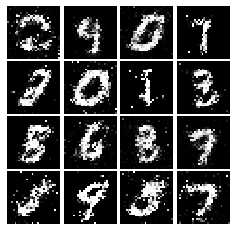

Epoch: 4, Iter: 2000, D: 1.202, G:0.9506


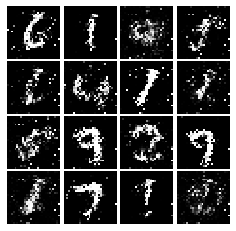

Epoch: 4, Iter: 2020, D: 1.322, G:0.8175


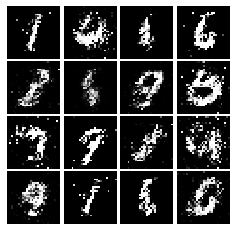

Epoch: 4, Iter: 2040, D: 1.147, G:1.176


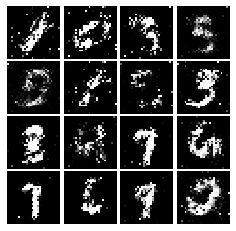

Epoch: 4, Iter: 2060, D: 1.276, G:0.9741


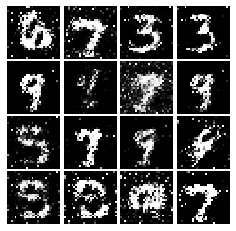

Epoch: 4, Iter: 2080, D: 1.322, G:1.037


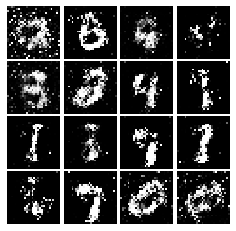

Epoch: 4, Iter: 2100, D: 1.271, G:1.227


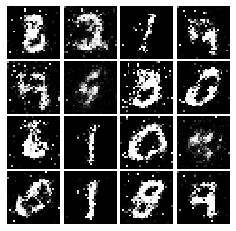

Epoch: 4, Iter: 2120, D: 1.276, G:1.02


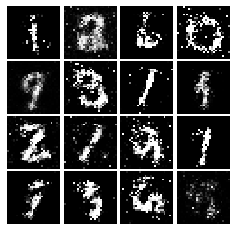

Epoch: 4, Iter: 2140, D: 1.206, G:0.8247


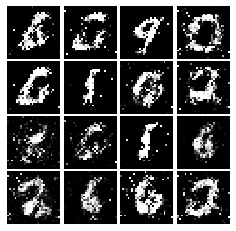

Epoch: 4, Iter: 2160, D: 1.375, G:0.9111


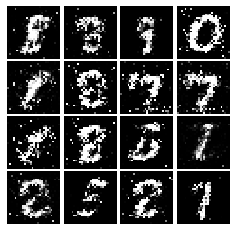

Epoch: 4, Iter: 2180, D: 1.258, G:0.899


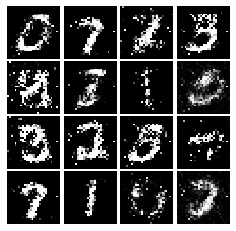

Epoch: 4, Iter: 2200, D: 1.291, G:0.8218


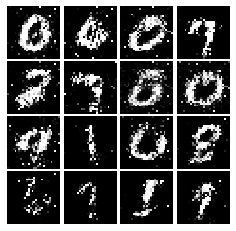

Epoch: 4, Iter: 2220, D: 1.274, G:0.8536


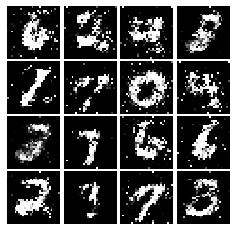

Epoch: 4, Iter: 2240, D: 1.371, G:0.7585


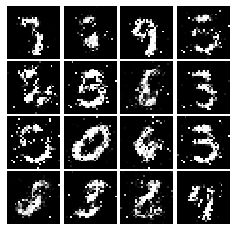

Epoch: 4, Iter: 2260, D: 1.259, G:0.8215


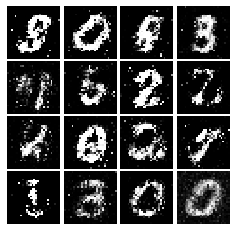

Epoch: 4, Iter: 2280, D: 1.294, G:0.9361


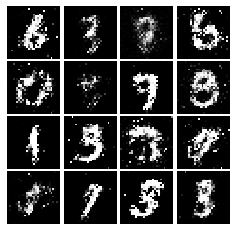

Epoch: 4, Iter: 2300, D: 1.247, G:0.9328


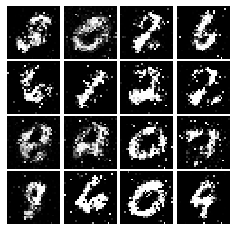

Epoch: 4, Iter: 2320, D: 1.211, G:0.9641


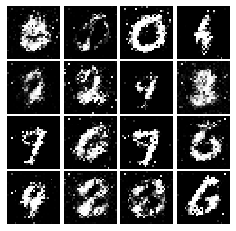

Epoch: 4, Iter: 2340, D: 1.188, G:1.043


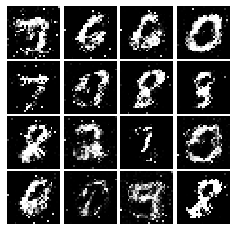

Epoch: 5, Iter: 2360, D: 1.332, G:0.9047


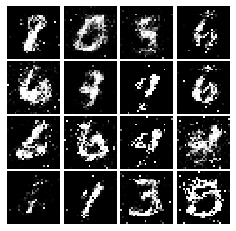

Epoch: 5, Iter: 2380, D: 1.331, G:0.8625


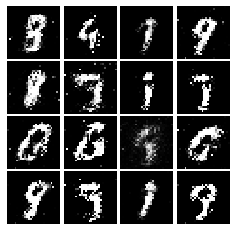

Epoch: 5, Iter: 2400, D: 1.286, G:0.9425


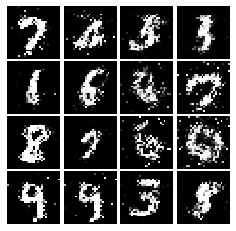

Epoch: 5, Iter: 2420, D: 1.325, G:0.9009


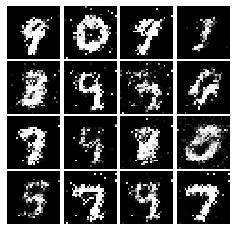

Epoch: 5, Iter: 2440, D: 1.362, G:0.811


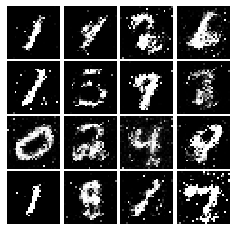

Epoch: 5, Iter: 2460, D: 1.19, G:0.9645


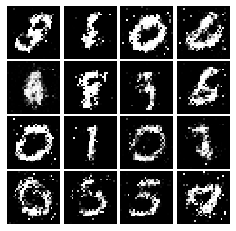

Epoch: 5, Iter: 2480, D: 1.263, G:0.8949


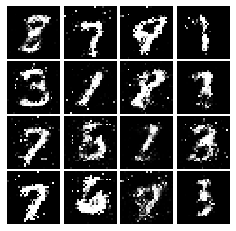

Epoch: 5, Iter: 2500, D: 1.203, G:0.8738


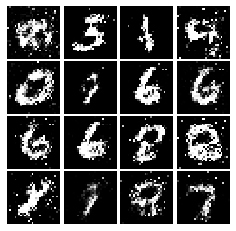

Epoch: 5, Iter: 2520, D: 1.336, G:0.8675


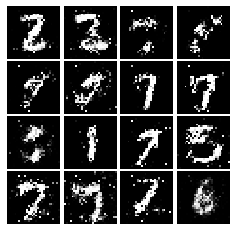

Epoch: 5, Iter: 2540, D: 1.358, G:0.8361


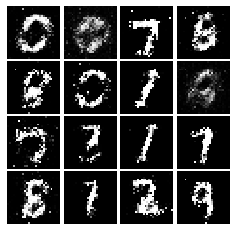

Epoch: 5, Iter: 2560, D: 1.395, G:0.8678


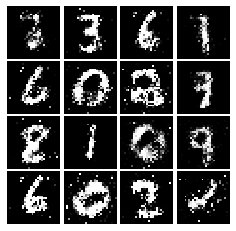

Epoch: 5, Iter: 2580, D: 1.344, G:1.013


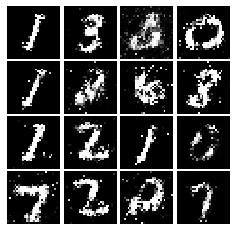

Epoch: 5, Iter: 2600, D: 1.349, G:0.7297


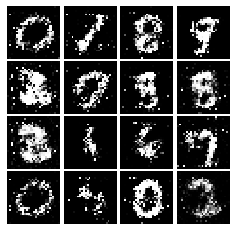

Epoch: 5, Iter: 2620, D: 1.271, G:0.8144


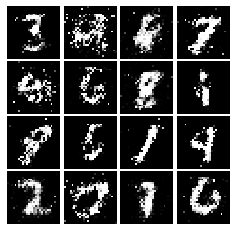

Epoch: 5, Iter: 2640, D: 1.377, G:0.9413


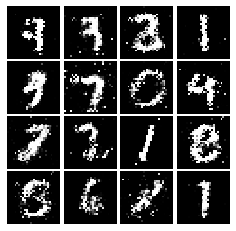

Epoch: 5, Iter: 2660, D: 1.288, G:0.808


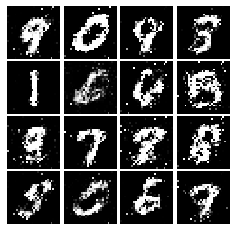

Epoch: 5, Iter: 2680, D: 1.477, G:0.8655


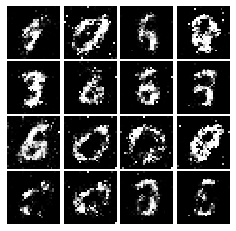

Epoch: 5, Iter: 2700, D: 1.418, G:0.8738


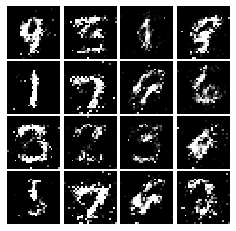

Epoch: 5, Iter: 2720, D: 1.271, G:0.8775


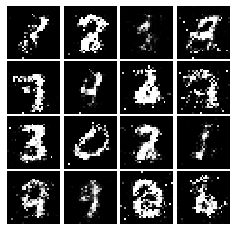

Epoch: 5, Iter: 2740, D: 1.286, G:0.8508


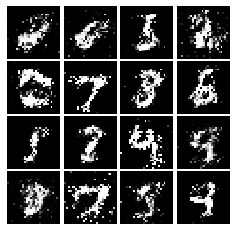

Epoch: 5, Iter: 2760, D: 1.276, G:0.8113


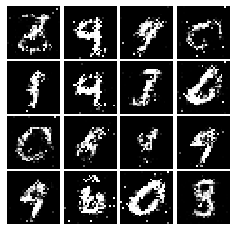

Epoch: 5, Iter: 2780, D: 1.276, G:0.9069


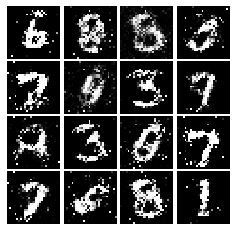

Epoch: 5, Iter: 2800, D: 1.297, G:0.7755


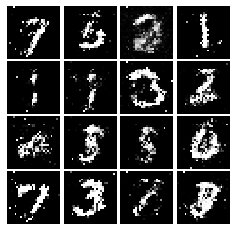

Epoch: 6, Iter: 2820, D: 1.288, G:0.9614


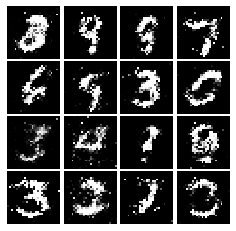

Epoch: 6, Iter: 2840, D: 1.324, G:0.8994


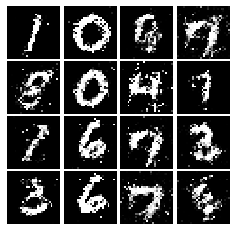

Epoch: 6, Iter: 2860, D: 1.362, G:0.8308


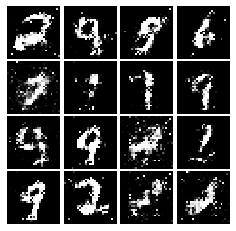

Epoch: 6, Iter: 2880, D: 1.159, G:0.889


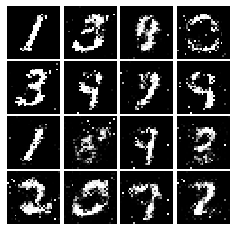

Epoch: 6, Iter: 2900, D: 1.302, G:0.7795


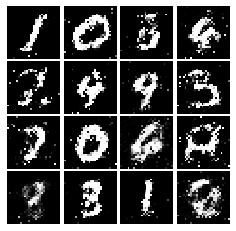

Epoch: 6, Iter: 2920, D: 1.412, G:0.9159


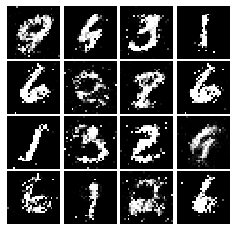

Epoch: 6, Iter: 2940, D: 1.349, G:0.829


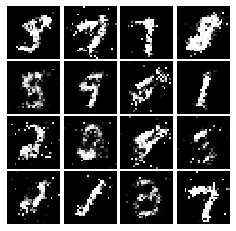

Epoch: 6, Iter: 2960, D: 1.343, G:0.7568


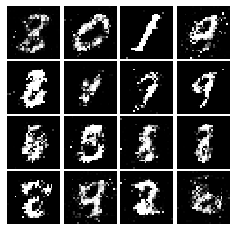

Epoch: 6, Iter: 2980, D: 1.356, G:0.8284


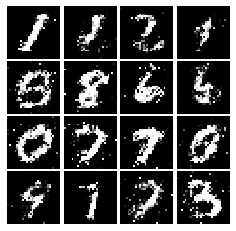

Epoch: 6, Iter: 3000, D: 1.377, G:0.8097


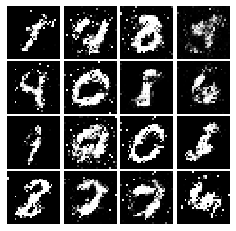

Epoch: 6, Iter: 3020, D: 1.299, G:0.869


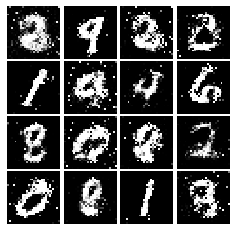

Epoch: 6, Iter: 3040, D: 1.386, G:0.8315


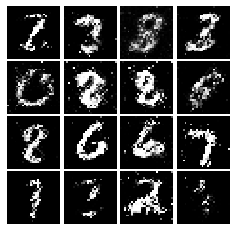

Epoch: 6, Iter: 3060, D: 1.322, G:0.7747


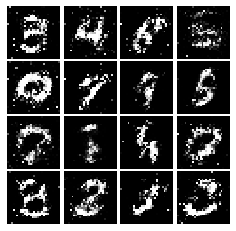

Epoch: 6, Iter: 3080, D: 1.293, G:0.8471


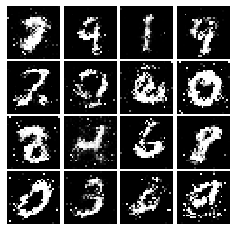

Epoch: 6, Iter: 3100, D: 1.256, G:0.7805


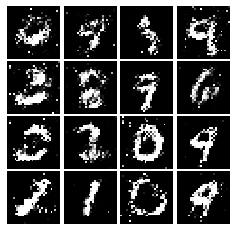

Epoch: 6, Iter: 3120, D: 1.344, G:0.7965


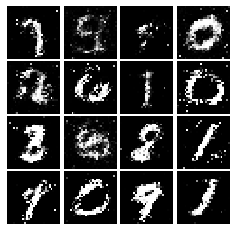

Epoch: 6, Iter: 3140, D: 1.382, G:0.7952


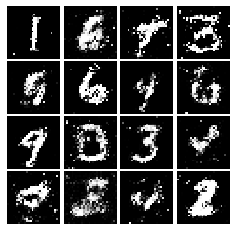

Epoch: 6, Iter: 3160, D: 1.299, G:0.857


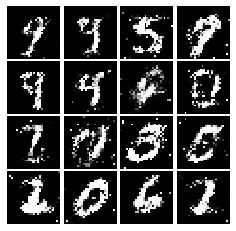

Epoch: 6, Iter: 3180, D: 1.257, G:0.8517


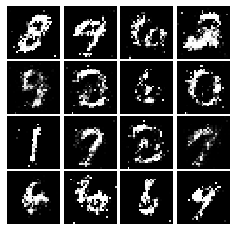

Epoch: 6, Iter: 3200, D: 1.373, G:0.8221


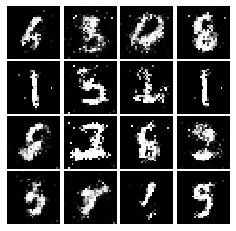

Epoch: 6, Iter: 3220, D: 1.364, G:0.8841


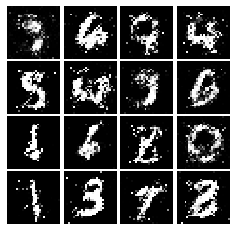

Epoch: 6, Iter: 3240, D: 1.283, G:0.7977


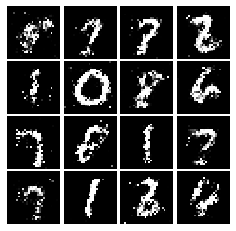

Epoch: 6, Iter: 3260, D: 1.314, G:0.8273


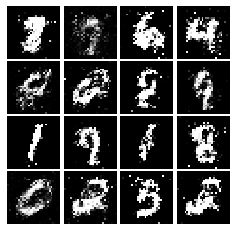

Epoch: 6, Iter: 3280, D: 1.267, G:0.8687


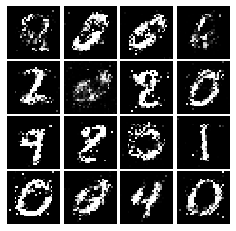

Epoch: 7, Iter: 3300, D: 1.317, G:0.7309


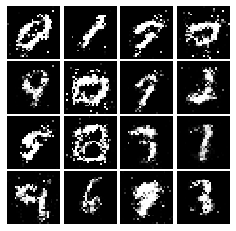

Epoch: 7, Iter: 3320, D: 1.268, G:0.8082


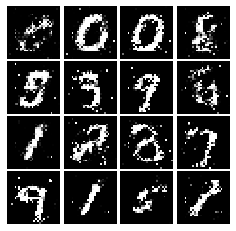

Epoch: 7, Iter: 3340, D: 1.309, G:0.8687


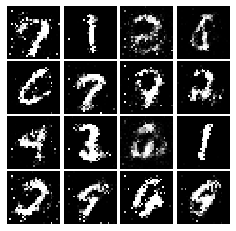

Epoch: 7, Iter: 3360, D: 1.396, G:0.7106


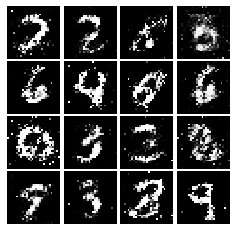

Epoch: 7, Iter: 3380, D: 1.337, G:0.8036


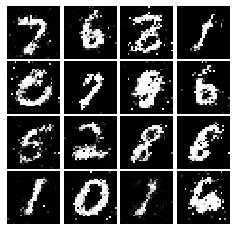

Epoch: 7, Iter: 3400, D: 1.391, G:0.7611


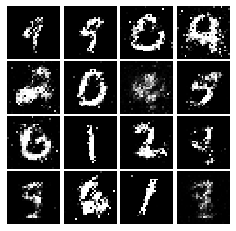

Epoch: 7, Iter: 3420, D: 1.299, G:0.8634


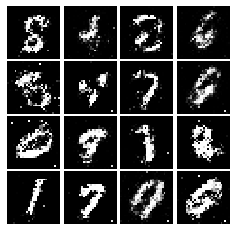

Epoch: 7, Iter: 3440, D: 1.283, G:0.9133


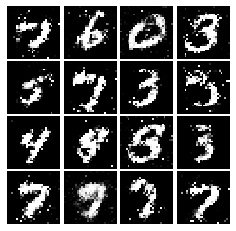

Epoch: 7, Iter: 3460, D: 1.288, G:0.7274


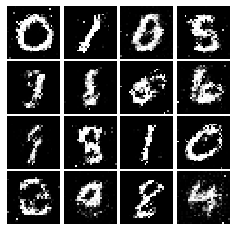

Epoch: 7, Iter: 3480, D: 1.302, G:0.7903


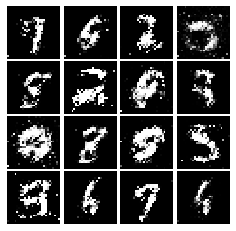

Epoch: 7, Iter: 3500, D: 1.273, G:0.8016


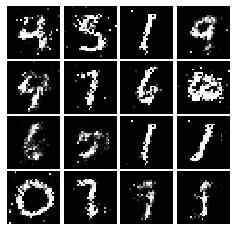

Epoch: 7, Iter: 3520, D: 1.397, G:0.7642


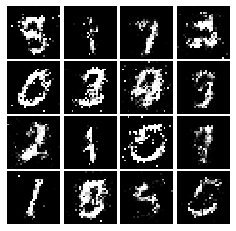

Epoch: 7, Iter: 3540, D: 1.204, G:0.7359


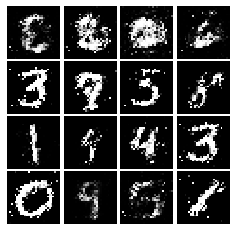

Epoch: 7, Iter: 3560, D: 1.185, G:0.9025


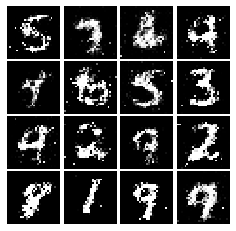

Epoch: 7, Iter: 3580, D: 1.352, G:0.8478


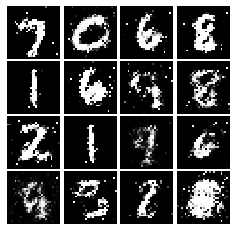

Epoch: 7, Iter: 3600, D: 1.3, G:0.8503


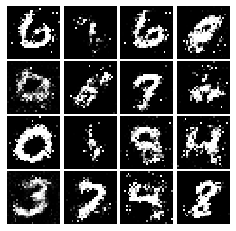

Epoch: 7, Iter: 3620, D: 1.277, G:0.8503


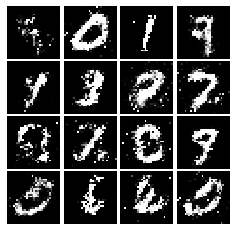

Epoch: 7, Iter: 3640, D: 1.345, G:0.7273


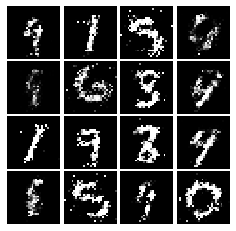

Epoch: 7, Iter: 3660, D: 1.279, G:0.7899


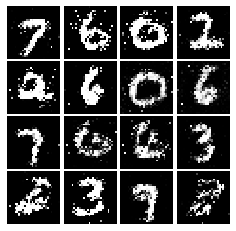

Epoch: 7, Iter: 3680, D: 1.3, G:0.7781


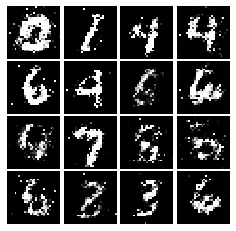

Epoch: 7, Iter: 3700, D: 1.281, G:0.7757


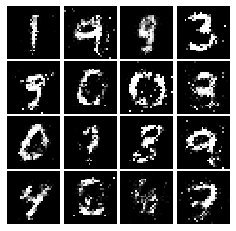

Epoch: 7, Iter: 3720, D: 1.313, G:0.8476


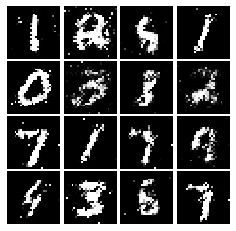

Epoch: 7, Iter: 3740, D: 1.286, G:0.8249


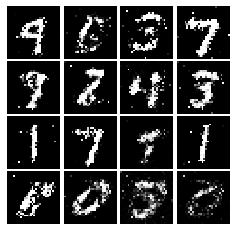

Epoch: 8, Iter: 3760, D: 1.345, G:0.8343


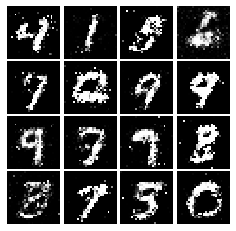

Epoch: 8, Iter: 3780, D: 1.342, G:0.8031


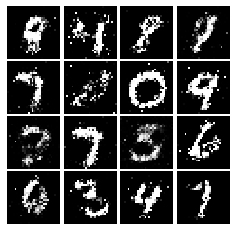

Epoch: 8, Iter: 3800, D: 1.29, G:0.7686


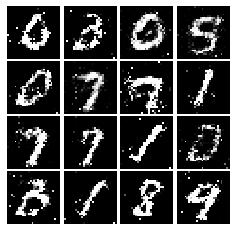

Epoch: 8, Iter: 3820, D: 1.445, G:0.7528


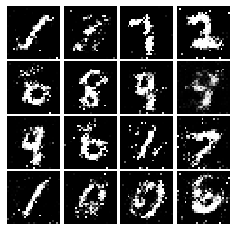

Epoch: 8, Iter: 3840, D: 1.359, G:0.7722


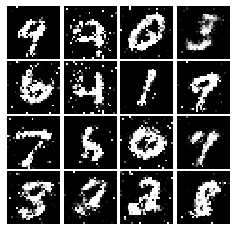

Epoch: 8, Iter: 3860, D: 1.308, G:0.7996


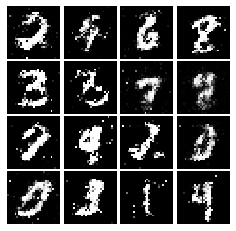

Epoch: 8, Iter: 3880, D: 1.301, G:0.7356


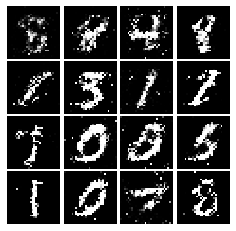

Epoch: 8, Iter: 3900, D: 1.419, G:0.8163


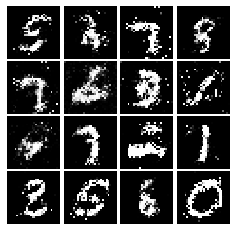

Epoch: 8, Iter: 3920, D: 1.291, G:0.8139


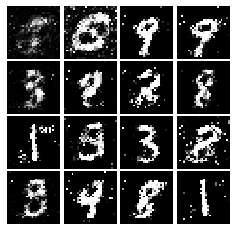

Epoch: 8, Iter: 3940, D: 1.343, G:0.8923


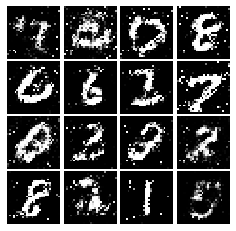

Epoch: 8, Iter: 3960, D: 1.28, G:0.8604


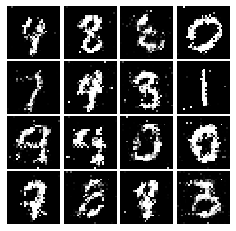

Epoch: 8, Iter: 3980, D: 1.284, G:0.8233


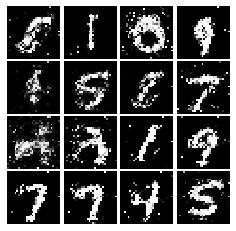

Epoch: 8, Iter: 4000, D: 1.348, G:0.7583


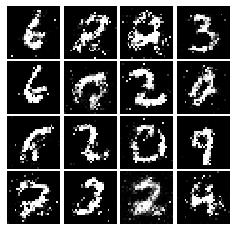

Epoch: 8, Iter: 4020, D: 1.265, G:0.7914


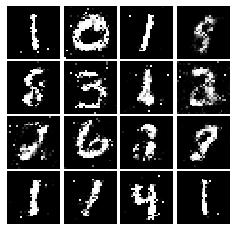

Epoch: 8, Iter: 4040, D: 1.393, G:0.7491


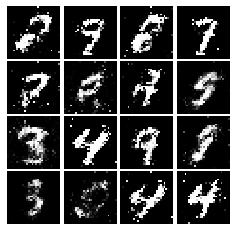

Epoch: 8, Iter: 4060, D: 1.301, G:0.7992


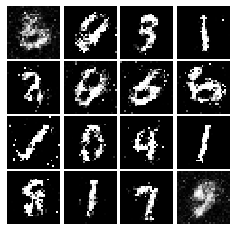

Epoch: 8, Iter: 4080, D: 1.404, G:0.7767


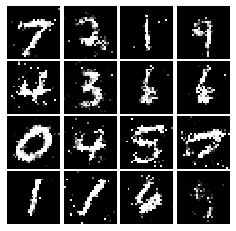

Epoch: 8, Iter: 4100, D: 1.455, G:0.7869


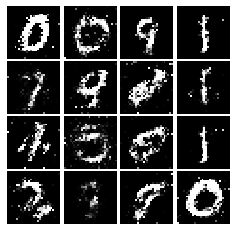

Epoch: 8, Iter: 4120, D: 1.286, G:0.8024


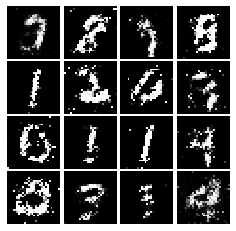

Epoch: 8, Iter: 4140, D: 1.306, G:0.8239


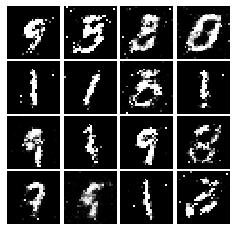

Epoch: 8, Iter: 4160, D: 1.299, G:0.7896


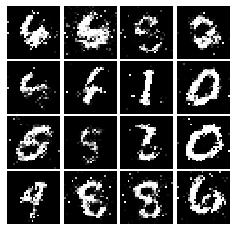

Epoch: 8, Iter: 4180, D: 1.38, G:0.7617


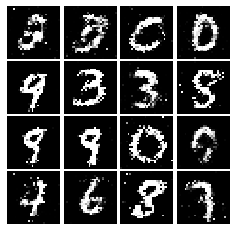

Epoch: 8, Iter: 4200, D: 1.354, G:0.7728


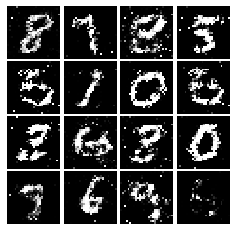

Epoch: 8, Iter: 4220, D: 1.27, G:0.8387


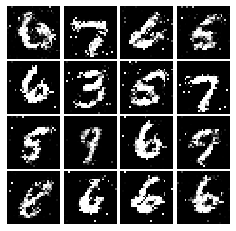

Epoch: 9, Iter: 4240, D: 1.438, G:0.7959


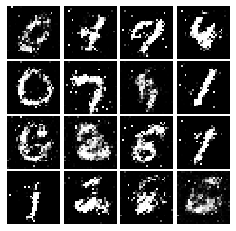

Epoch: 9, Iter: 4260, D: 1.271, G:0.7731


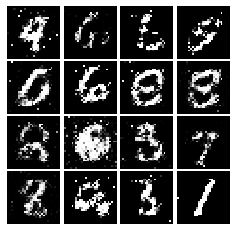

Epoch: 9, Iter: 4280, D: 1.354, G:0.7816


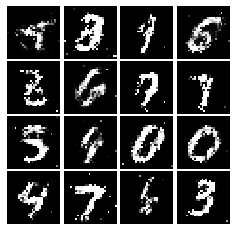

Epoch: 9, Iter: 4300, D: 1.289, G:0.8039


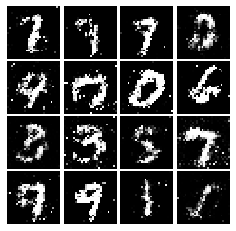

Epoch: 9, Iter: 4320, D: 1.389, G:0.7779


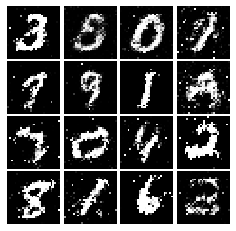

Epoch: 9, Iter: 4340, D: 1.377, G:0.7321


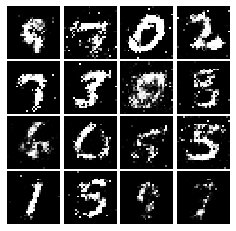

Epoch: 9, Iter: 4360, D: 1.356, G:0.8621


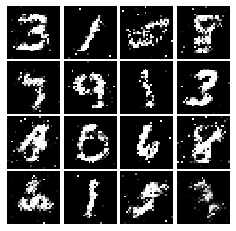

Epoch: 9, Iter: 4380, D: 1.411, G:0.8889


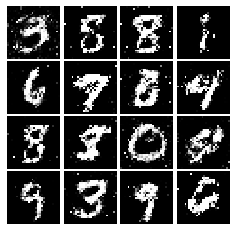

Epoch: 9, Iter: 4400, D: 1.288, G:0.8236


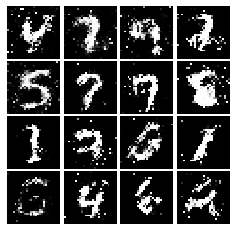

Epoch: 9, Iter: 4420, D: 1.311, G:0.8283


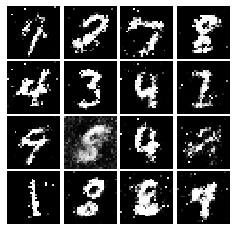

Epoch: 9, Iter: 4440, D: 1.34, G:0.7547


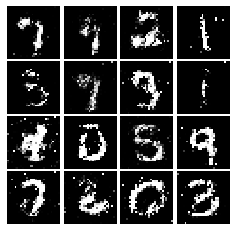

Epoch: 9, Iter: 4460, D: 1.351, G:0.891


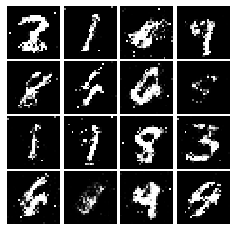

Epoch: 9, Iter: 4480, D: 1.369, G:0.8756


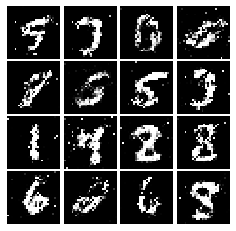

Epoch: 9, Iter: 4500, D: 1.322, G:0.7968


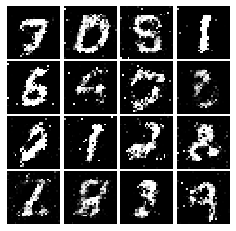

Epoch: 9, Iter: 4520, D: 1.323, G:0.7985


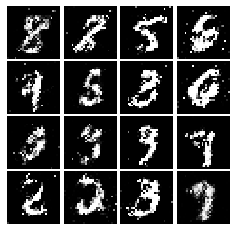

Epoch: 9, Iter: 4540, D: 1.348, G:0.7564


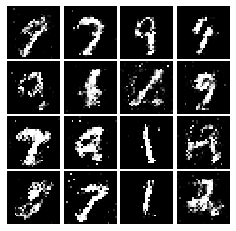

Epoch: 9, Iter: 4560, D: 1.299, G:0.7246


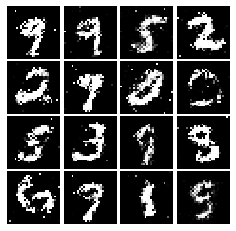

Epoch: 9, Iter: 4580, D: 1.379, G:0.8064


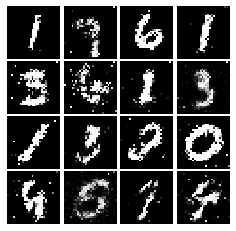

Epoch: 9, Iter: 4600, D: 1.326, G:0.7483


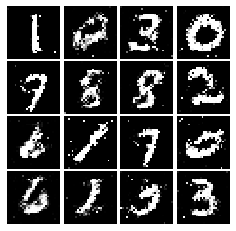

Epoch: 9, Iter: 4620, D: 1.409, G:0.7452


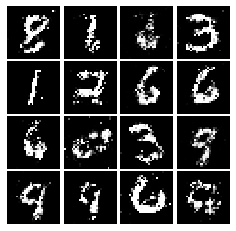

Epoch: 9, Iter: 4640, D: 1.324, G:0.8014


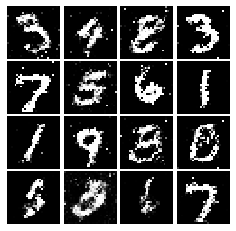

Epoch: 9, Iter: 4660, D: 1.379, G:0.8278


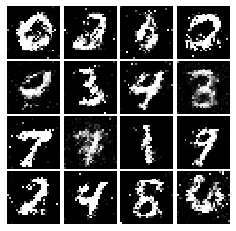

Epoch: 9, Iter: 4680, D: 1.318, G:0.8185


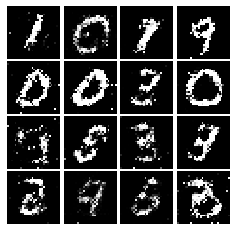

Final images


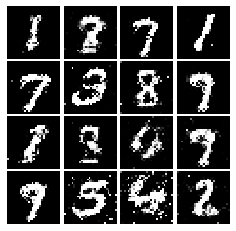

In [210]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [211]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * tf.reduce_mean((scores_real - 1) ** 2)
    loss += 0.5 * tf.reduce_mean(scores_fake ** 2)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * tf.reduce_mean((scores_fake - 1) ** 2)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [212]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 1.368, G:0.4288


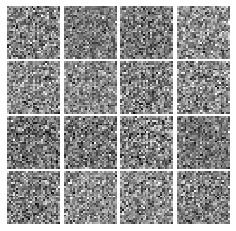

Epoch: 0, Iter: 20, D: 0.04319, G:0.833


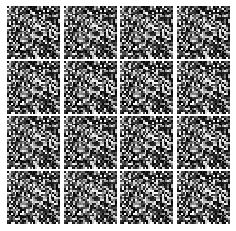

Epoch: 0, Iter: 40, D: 0.0122, G:0.7271


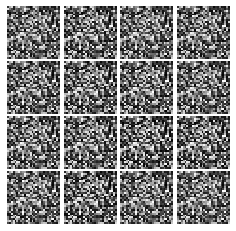

Epoch: 0, Iter: 60, D: 0.03566, G:0.635


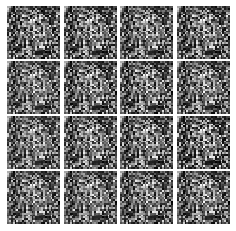

Epoch: 0, Iter: 80, D: 0.1256, G:0.9818


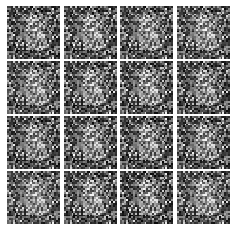

Epoch: 0, Iter: 100, D: 0.443, G:1.045


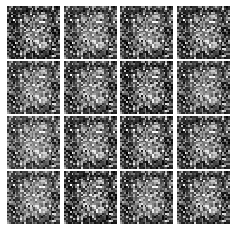

Epoch: 0, Iter: 120, D: 0.07499, G:0.4888


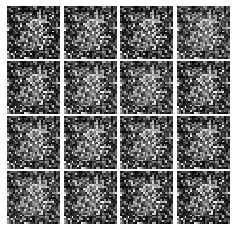

Epoch: 0, Iter: 140, D: 0.562, G:0.2409


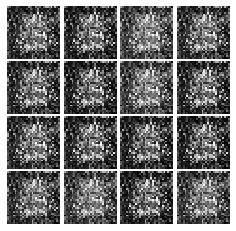

Epoch: 0, Iter: 160, D: 0.3132, G:0.29


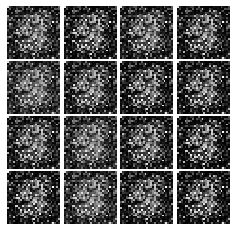

Epoch: 0, Iter: 180, D: 0.4006, G:0.009363


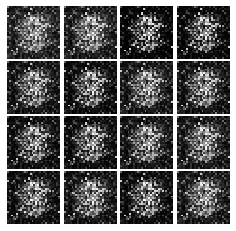

Epoch: 0, Iter: 200, D: 0.2227, G:0.8639


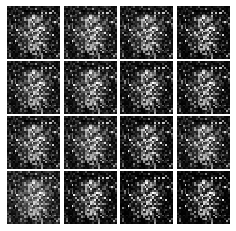

Epoch: 0, Iter: 220, D: 0.1299, G:0.3601


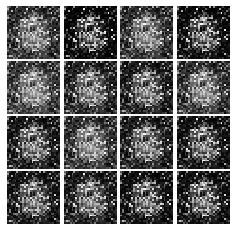

Epoch: 0, Iter: 240, D: 0.2308, G:0.1959


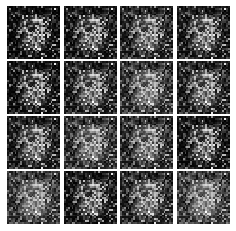

Epoch: 0, Iter: 260, D: 0.09383, G:0.4632


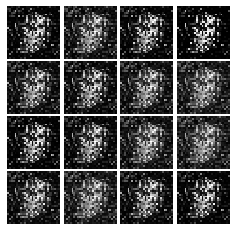

Epoch: 0, Iter: 280, D: 0.1605, G:0.3229


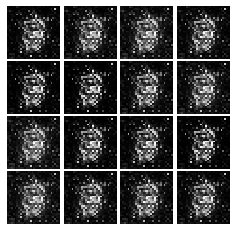

Epoch: 0, Iter: 300, D: 0.1074, G:0.5727


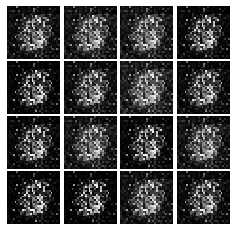

Epoch: 0, Iter: 320, D: 0.1223, G:0.516


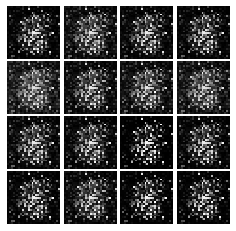

Epoch: 0, Iter: 340, D: 0.1694, G:0.8011


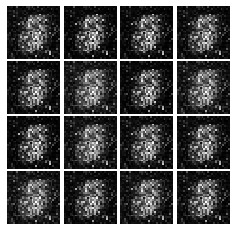

Epoch: 0, Iter: 360, D: 0.09331, G:0.5249


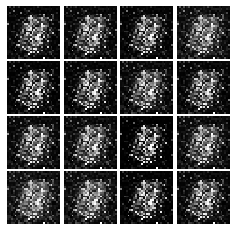

Epoch: 0, Iter: 380, D: 0.06113, G:0.5127


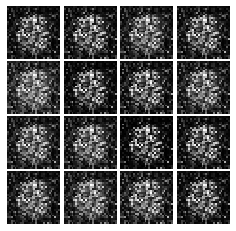

Epoch: 0, Iter: 400, D: 0.07333, G:0.5427


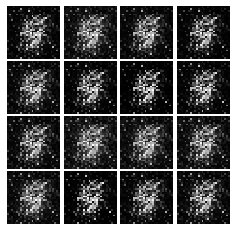

Epoch: 0, Iter: 420, D: 0.07897, G:0.4548


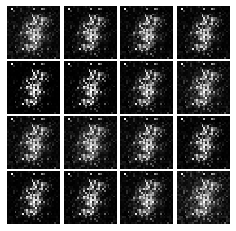

Epoch: 0, Iter: 440, D: 0.06234, G:0.5503


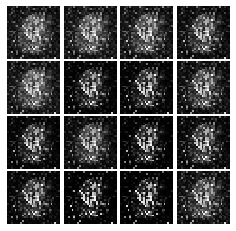

Epoch: 0, Iter: 460, D: 0.2818, G:0.5007


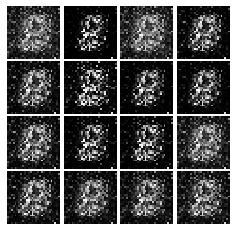

Epoch: 1, Iter: 480, D: 0.1092, G:0.4092


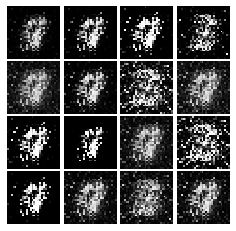

Epoch: 1, Iter: 500, D: 0.2265, G:0.238


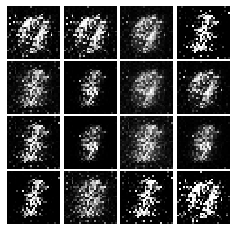

Epoch: 1, Iter: 520, D: 0.1488, G:0.51


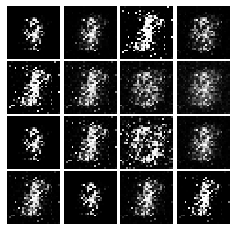

Epoch: 1, Iter: 540, D: 0.195, G:0.5402


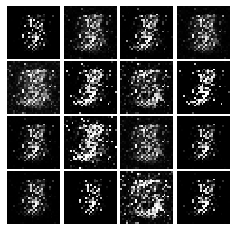

Epoch: 1, Iter: 560, D: 0.1882, G:0.5494


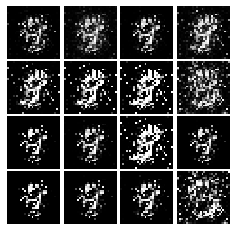

Epoch: 1, Iter: 580, D: 0.5948, G:0.08494


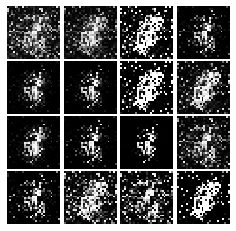

Epoch: 1, Iter: 600, D: 0.1853, G:0.4127


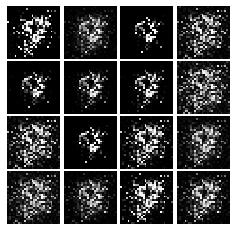

Epoch: 1, Iter: 620, D: 0.1129, G:0.5058


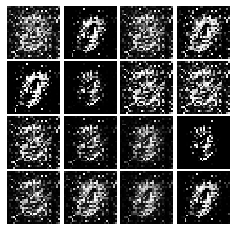

Epoch: 1, Iter: 640, D: 0.1195, G:0.2436


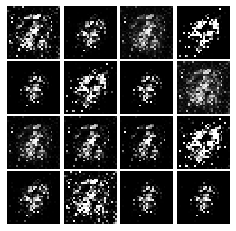

Epoch: 1, Iter: 660, D: 0.1218, G:0.3756


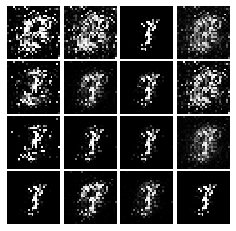

Epoch: 1, Iter: 680, D: 0.1678, G:0.55


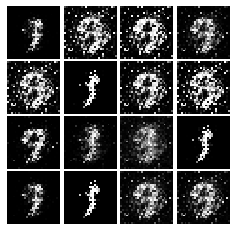

Epoch: 1, Iter: 700, D: 0.2297, G:0.1833


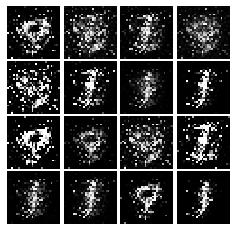

Epoch: 1, Iter: 720, D: 0.5541, G:0.1126


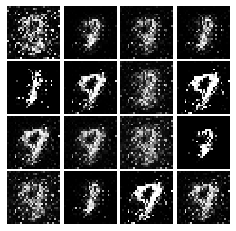

Epoch: 1, Iter: 740, D: 0.09497, G:0.4742


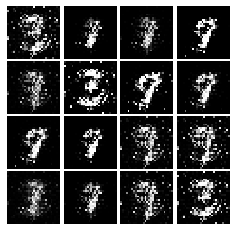

Epoch: 1, Iter: 760, D: 0.1174, G:0.4217


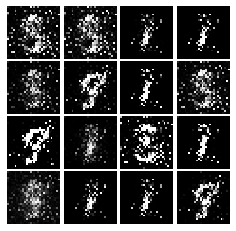

Epoch: 1, Iter: 780, D: 0.1222, G:0.5857


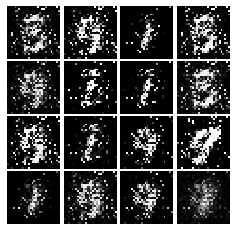

Epoch: 1, Iter: 800, D: 0.0919, G:0.428


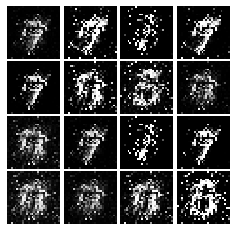

Epoch: 1, Iter: 820, D: 0.07138, G:0.4298


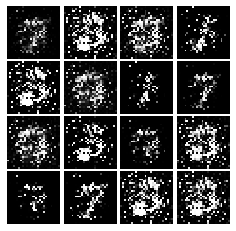

Epoch: 1, Iter: 840, D: 0.08658, G:0.555


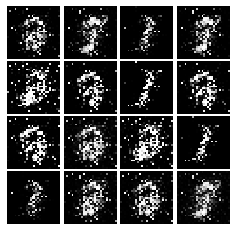

Epoch: 1, Iter: 860, D: 0.1282, G:0.2863


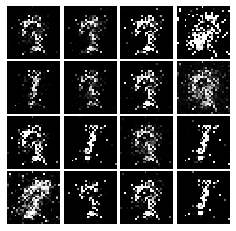

Epoch: 1, Iter: 880, D: 0.08012, G:0.07089


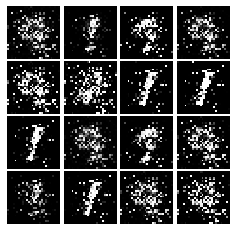

Epoch: 1, Iter: 900, D: 0.09865, G:0.554


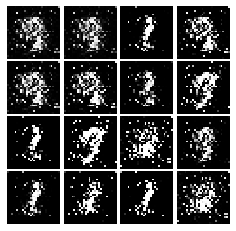

Epoch: 1, Iter: 920, D: 0.1349, G:0.3881


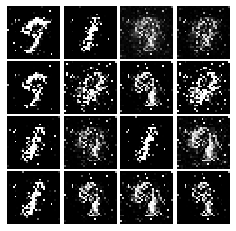

Epoch: 2, Iter: 940, D: 0.1442, G:0.3261


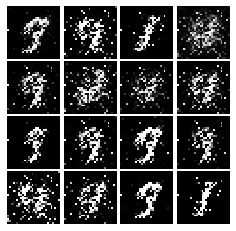

Epoch: 2, Iter: 960, D: 0.09557, G:0.6988


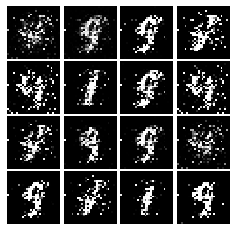

Epoch: 2, Iter: 980, D: 0.1092, G:0.4008


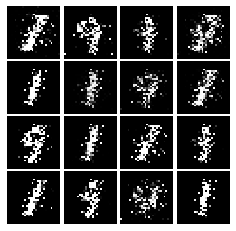

Epoch: 2, Iter: 1000, D: 0.1408, G:0.2844


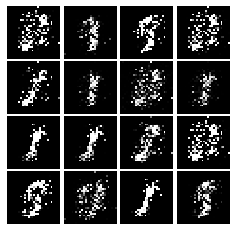

Epoch: 2, Iter: 1020, D: 0.1176, G:0.357


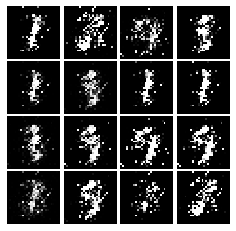

Epoch: 2, Iter: 1040, D: 0.1225, G:0.3149


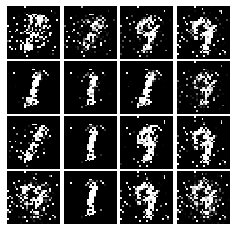

Epoch: 2, Iter: 1060, D: 0.2508, G:0.5885


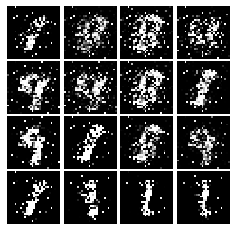

Epoch: 2, Iter: 1080, D: 0.1446, G:1.029


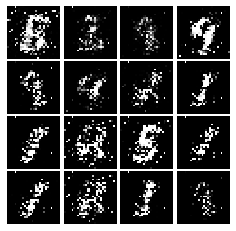

Epoch: 2, Iter: 1100, D: 0.1252, G:0.5343


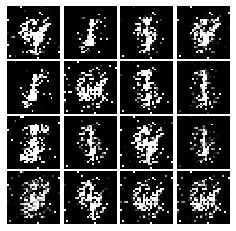

Epoch: 2, Iter: 1120, D: 0.09729, G:0.3075


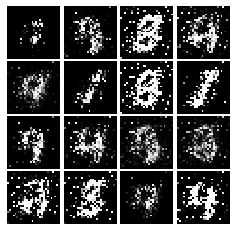

Epoch: 2, Iter: 1140, D: 0.1124, G:0.4449


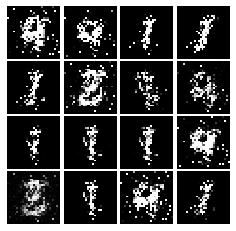

Epoch: 2, Iter: 1160, D: 0.1751, G:0.1765


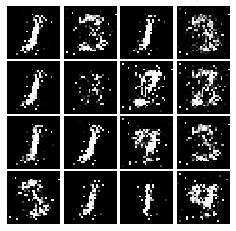

Epoch: 2, Iter: 1180, D: 0.1141, G:0.3465


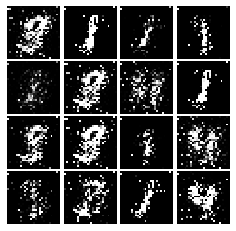

Epoch: 2, Iter: 1200, D: 0.1203, G:0.3313


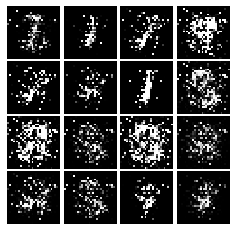

Epoch: 2, Iter: 1220, D: 0.1303, G:0.3333


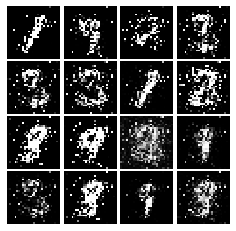

Epoch: 2, Iter: 1240, D: 0.1015, G:0.3762


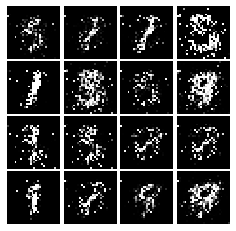

Epoch: 2, Iter: 1260, D: 0.1362, G:0.323


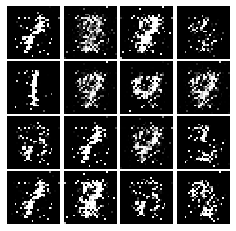

Epoch: 2, Iter: 1280, D: 0.1314, G:0.3434


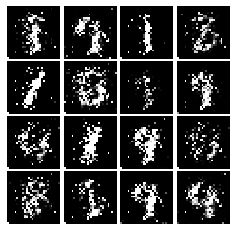

Epoch: 2, Iter: 1300, D: 0.1646, G:0.3035


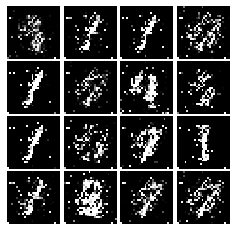

Epoch: 2, Iter: 1320, D: 0.1724, G:0.2574


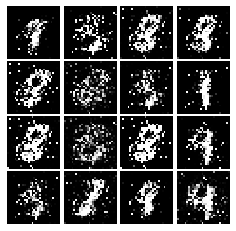

Epoch: 2, Iter: 1340, D: 0.1064, G:0.3529


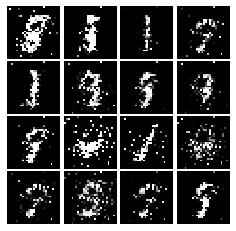

Epoch: 2, Iter: 1360, D: 0.125, G:0.4048


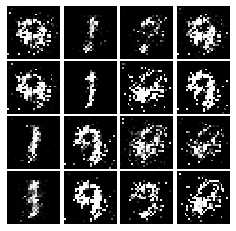

Epoch: 2, Iter: 1380, D: 0.2465, G:0.239


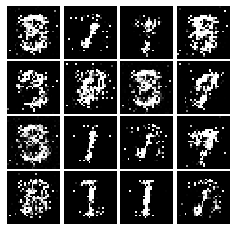

Epoch: 2, Iter: 1400, D: 0.1192, G:0.2763


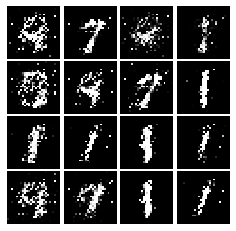

Epoch: 3, Iter: 1420, D: 0.152, G:0.2602


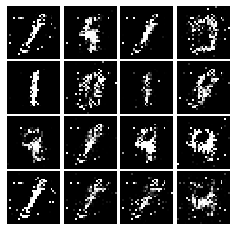

Epoch: 3, Iter: 1440, D: 0.1083, G:0.5224


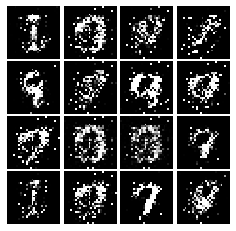

Epoch: 3, Iter: 1460, D: 0.1605, G:0.2343


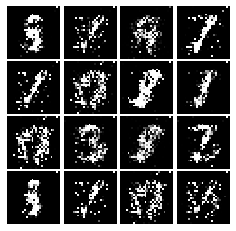

Epoch: 3, Iter: 1480, D: 0.1539, G:0.2536


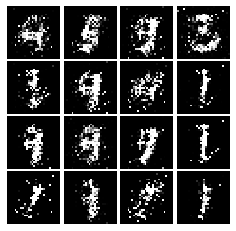

Epoch: 3, Iter: 1500, D: 0.1276, G:0.2576


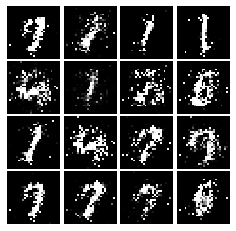

Epoch: 3, Iter: 1520, D: 0.1898, G:0.1362


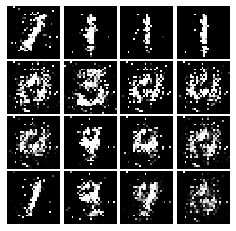

Epoch: 3, Iter: 1540, D: 0.1864, G:0.2914


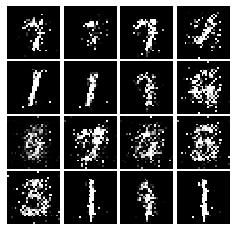

Epoch: 3, Iter: 1560, D: 0.128, G:0.3849


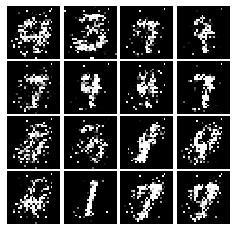

Epoch: 3, Iter: 1580, D: 0.2734, G:0.227


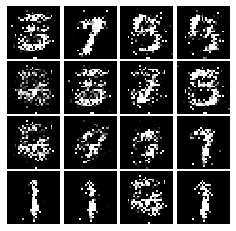

Epoch: 3, Iter: 1600, D: 0.1824, G:0.1944


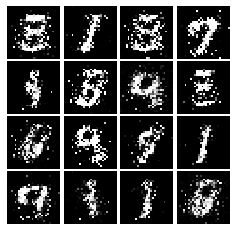

Epoch: 3, Iter: 1620, D: 0.1633, G:0.3391


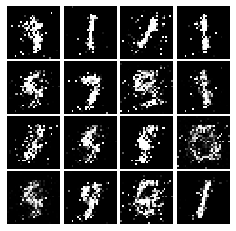

Epoch: 3, Iter: 1640, D: 0.2924, G:0.2852


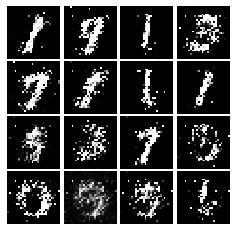

Epoch: 3, Iter: 1660, D: 0.1652, G:0.2678


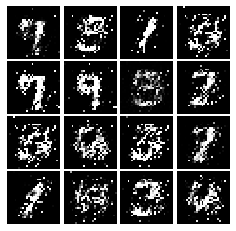

Epoch: 3, Iter: 1680, D: 0.1872, G:0.2494


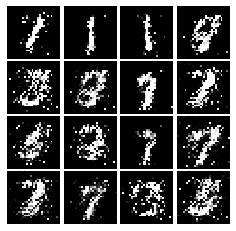

Epoch: 3, Iter: 1700, D: 0.1788, G:0.09415


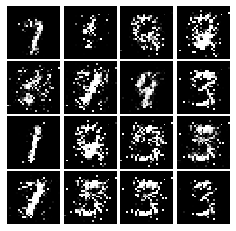

Epoch: 3, Iter: 1720, D: 0.1979, G:0.223


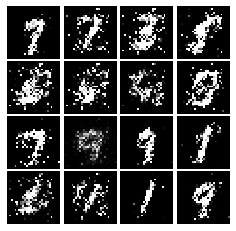

Epoch: 3, Iter: 1740, D: 0.1987, G:0.2482


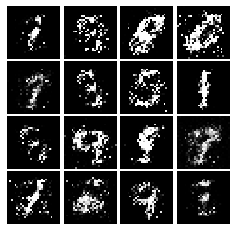

Epoch: 3, Iter: 1760, D: 0.1777, G:0.2537


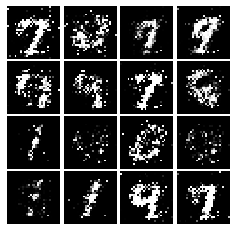

Epoch: 3, Iter: 1780, D: 0.1847, G:0.2305


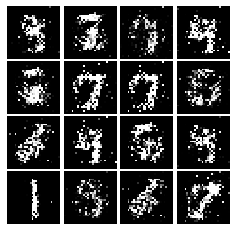

Epoch: 3, Iter: 1800, D: 0.2213, G:0.2183


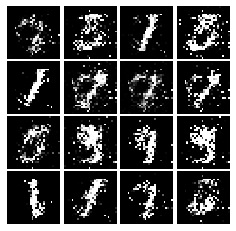

Epoch: 3, Iter: 1820, D: 0.182, G:0.2504


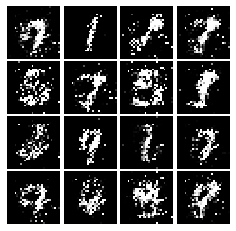

Epoch: 3, Iter: 1840, D: 0.1773, G:0.4174


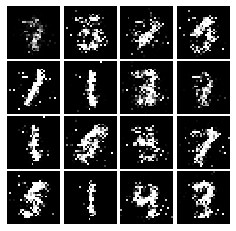

Epoch: 3, Iter: 1860, D: 0.1919, G:0.194


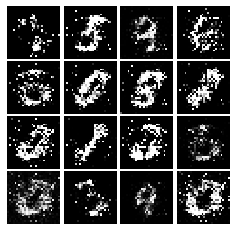

Epoch: 4, Iter: 1880, D: 0.2117, G:0.1892


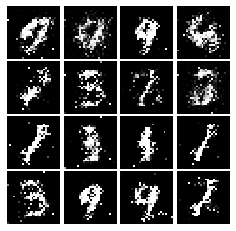

Epoch: 4, Iter: 1900, D: 0.1923, G:0.1964


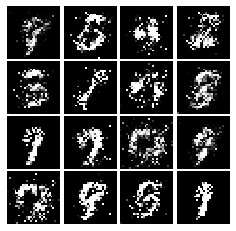

Epoch: 4, Iter: 1920, D: 0.2004, G:0.2404


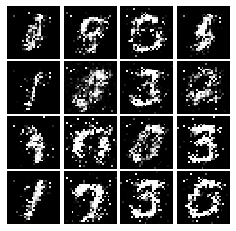

Epoch: 4, Iter: 1940, D: 0.2022, G:0.2118


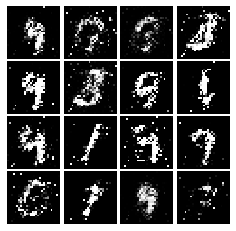

Epoch: 4, Iter: 1960, D: 0.2125, G:0.1976


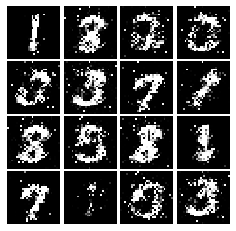

Epoch: 4, Iter: 1980, D: 0.2007, G:0.2102


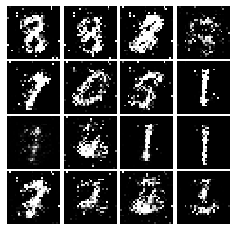

Epoch: 4, Iter: 2000, D: 0.2153, G:0.2801


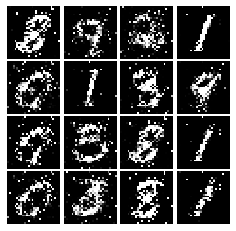

Epoch: 4, Iter: 2020, D: 0.195, G:0.1888


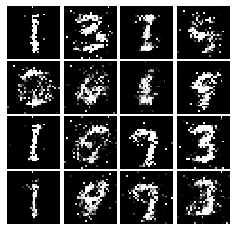

Epoch: 4, Iter: 2040, D: 0.2294, G:0.1587


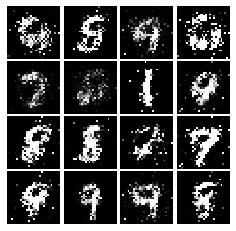

Epoch: 4, Iter: 2060, D: 0.1883, G:0.2151


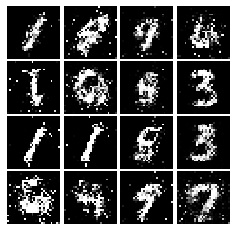

Epoch: 4, Iter: 2080, D: 0.2059, G:0.1936


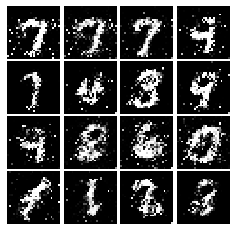

Epoch: 4, Iter: 2100, D: 0.2591, G:0.1669


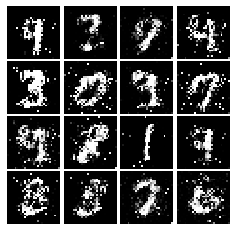

Epoch: 4, Iter: 2120, D: 0.2527, G:0.1628


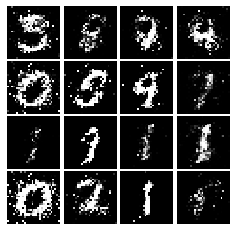

Epoch: 4, Iter: 2140, D: 0.2216, G:0.1811


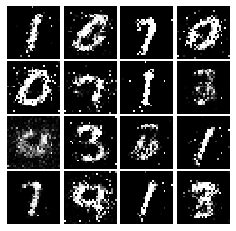

Epoch: 4, Iter: 2160, D: 0.227, G:0.1774


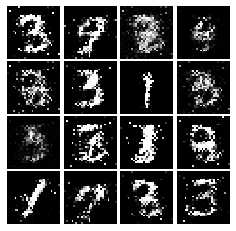

Epoch: 4, Iter: 2180, D: 0.2671, G:0.1824


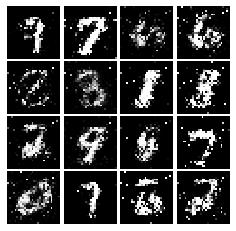

Epoch: 4, Iter: 2200, D: 0.2018, G:0.2111


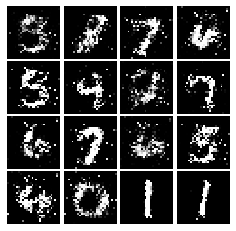

Epoch: 4, Iter: 2220, D: 0.2221, G:0.1686


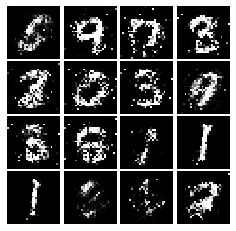

Epoch: 4, Iter: 2240, D: 0.213, G:0.1663


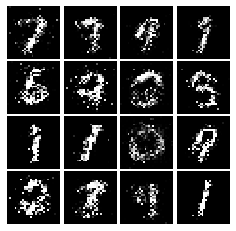

Epoch: 4, Iter: 2260, D: 0.2468, G:0.1857


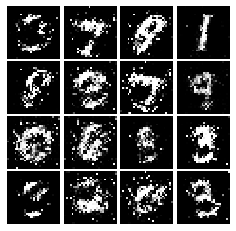

Epoch: 4, Iter: 2280, D: 0.2374, G:0.1802


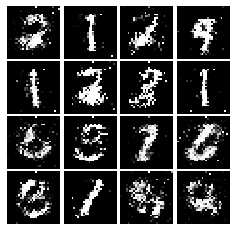

Epoch: 4, Iter: 2300, D: 0.2174, G:0.1963


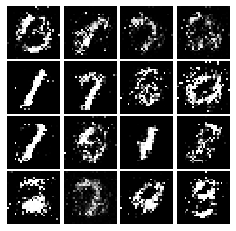

Epoch: 4, Iter: 2320, D: 0.2104, G:0.1946


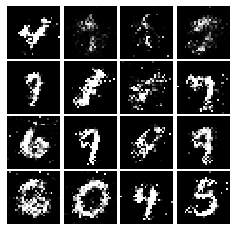

Epoch: 4, Iter: 2340, D: 0.2052, G:0.2161


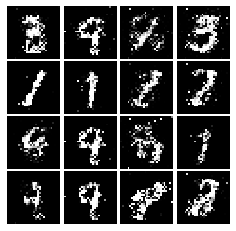

Epoch: 5, Iter: 2360, D: 0.2038, G:0.2389


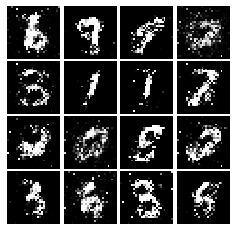

Epoch: 5, Iter: 2380, D: 0.2166, G:0.2183


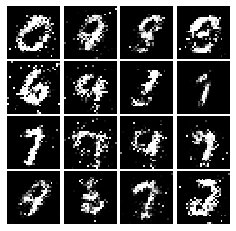

Epoch: 5, Iter: 2400, D: 0.2392, G:0.2215


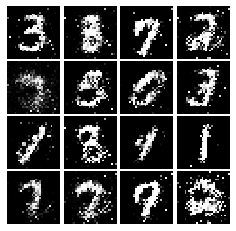

Epoch: 5, Iter: 2420, D: 0.21, G:0.2465


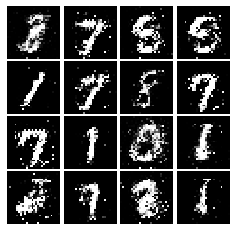

Epoch: 5, Iter: 2440, D: 0.2004, G:0.2081


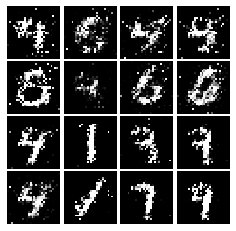

Epoch: 5, Iter: 2460, D: 0.1796, G:0.238


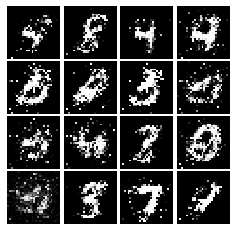

Epoch: 5, Iter: 2480, D: 0.2086, G:0.2097


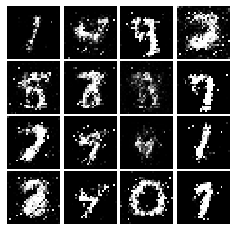

Epoch: 5, Iter: 2500, D: 0.231, G:0.2271


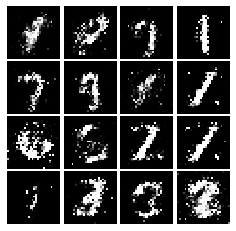

Epoch: 5, Iter: 2520, D: 0.2618, G:0.203


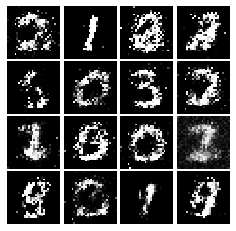

Epoch: 5, Iter: 2540, D: 0.2042, G:0.1693


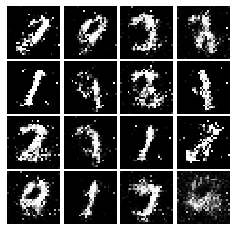

Epoch: 5, Iter: 2560, D: 0.2372, G:0.1753


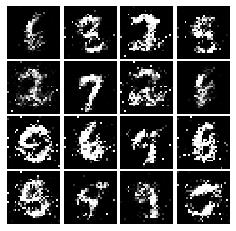

Epoch: 5, Iter: 2580, D: 0.229, G:0.1817


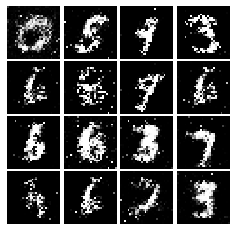

Epoch: 5, Iter: 2600, D: 0.2577, G:0.1718


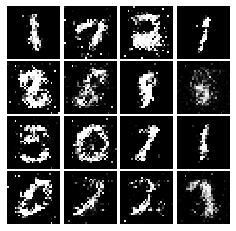

Epoch: 5, Iter: 2620, D: 0.2184, G:0.2046


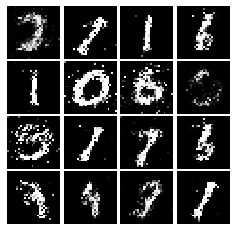

Epoch: 5, Iter: 2640, D: 0.2137, G:0.1894


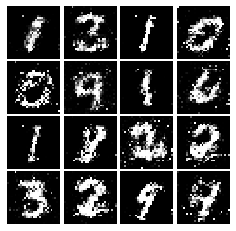

Epoch: 5, Iter: 2660, D: 0.2187, G:0.1682


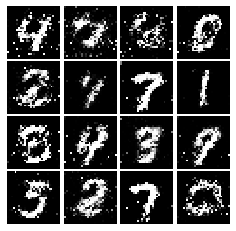

Epoch: 5, Iter: 2680, D: 0.2395, G:0.1724


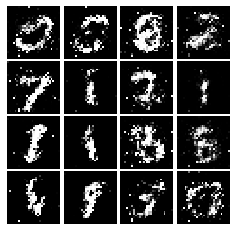

Epoch: 5, Iter: 2700, D: 0.2264, G:0.1634


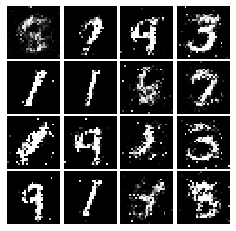

Epoch: 5, Iter: 2720, D: 0.2334, G:0.1624


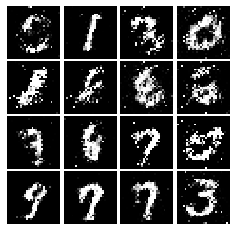

Epoch: 5, Iter: 2740, D: 0.2014, G:0.1993


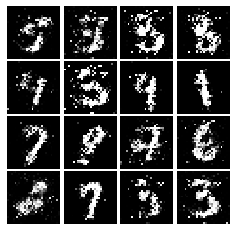

Epoch: 5, Iter: 2760, D: 0.2083, G:0.1764


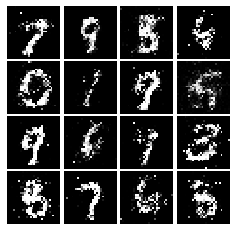

Epoch: 5, Iter: 2780, D: 0.2112, G:0.1702


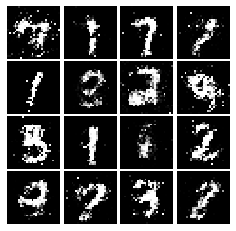

Epoch: 5, Iter: 2800, D: 0.237, G:0.1768


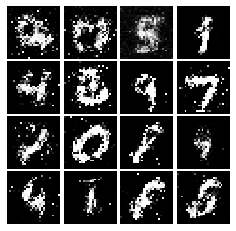

Epoch: 6, Iter: 2820, D: 0.2425, G:0.1774


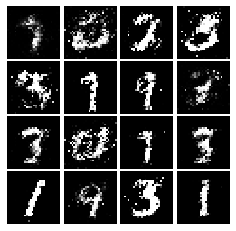

Epoch: 6, Iter: 2840, D: 0.2216, G:0.1691


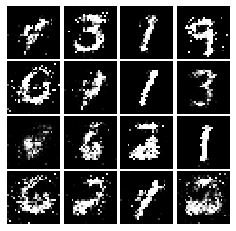

Epoch: 6, Iter: 2860, D: 0.1931, G:0.2157


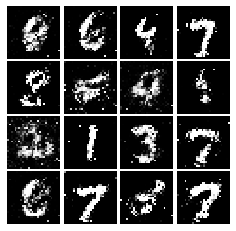

Epoch: 6, Iter: 2880, D: 0.1917, G:0.2396


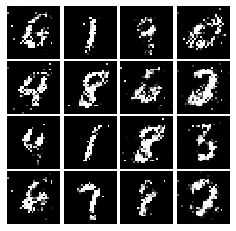

Epoch: 6, Iter: 2900, D: 0.2428, G:0.1716


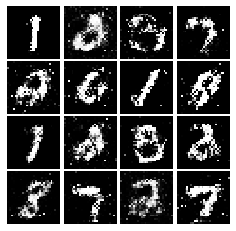

Epoch: 6, Iter: 2920, D: 0.2402, G:0.1856


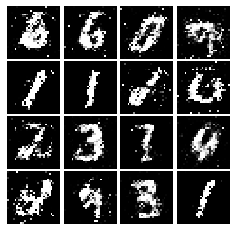

Epoch: 6, Iter: 2940, D: 0.1911, G:0.2022


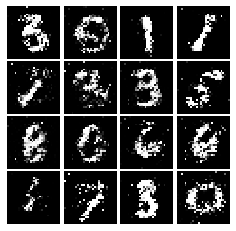

Epoch: 6, Iter: 2960, D: 0.2442, G:0.1716


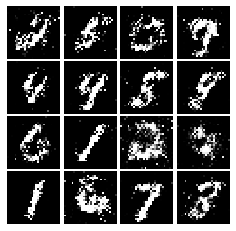

Epoch: 6, Iter: 2980, D: 0.2216, G:0.1638


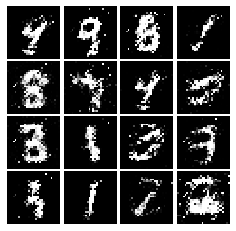

Epoch: 6, Iter: 3000, D: 0.2166, G:0.1929


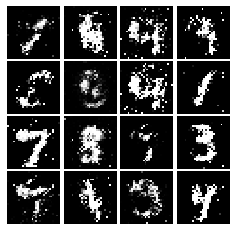

Epoch: 6, Iter: 3020, D: 0.241, G:0.1872


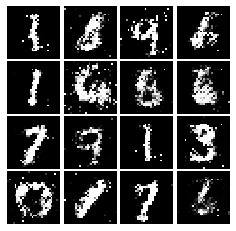

Epoch: 6, Iter: 3040, D: 0.2259, G:0.2143


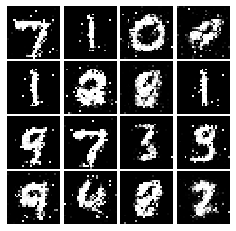

Epoch: 6, Iter: 3060, D: 0.2212, G:0.1552


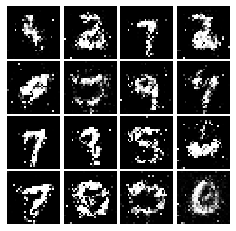

Epoch: 6, Iter: 3080, D: 0.2101, G:0.1706


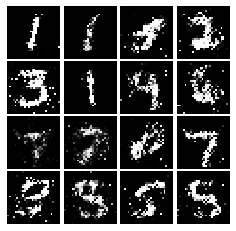

Epoch: 6, Iter: 3100, D: 0.2297, G:0.1499


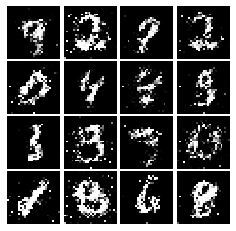

Epoch: 6, Iter: 3120, D: 0.2179, G:0.1524


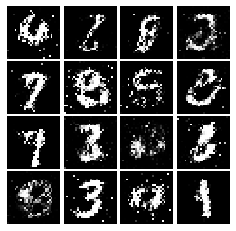

Epoch: 6, Iter: 3140, D: 0.2597, G:0.1685


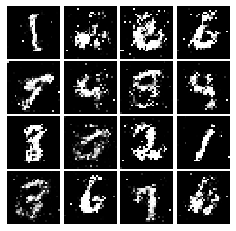

Epoch: 6, Iter: 3160, D: 0.2009, G:0.1722


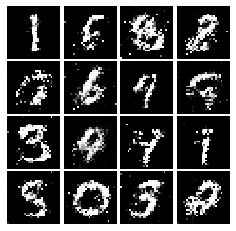

Epoch: 6, Iter: 3180, D: 0.2166, G:0.1903


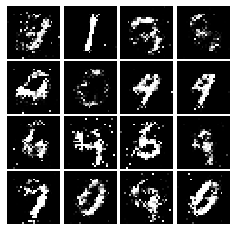

Epoch: 6, Iter: 3200, D: 0.2311, G:0.1724


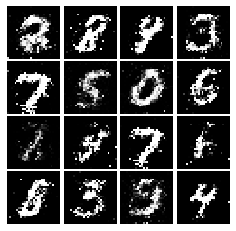

Epoch: 6, Iter: 3220, D: 0.2184, G:0.1872


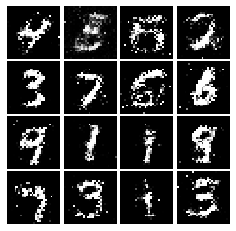

Epoch: 6, Iter: 3240, D: 0.2155, G:0.1774


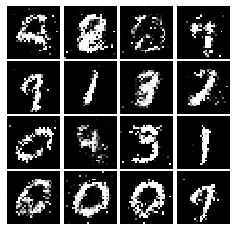

Epoch: 6, Iter: 3260, D: 0.2285, G:0.1731


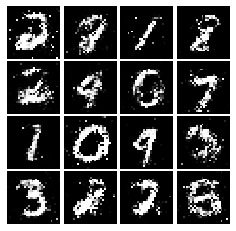

Epoch: 6, Iter: 3280, D: 0.228, G:0.1645


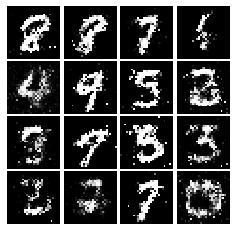

Epoch: 7, Iter: 3300, D: 0.22, G:0.1922


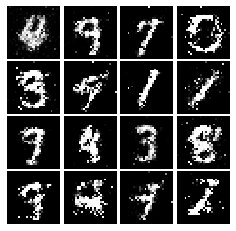

Epoch: 7, Iter: 3320, D: 0.2119, G:0.1808


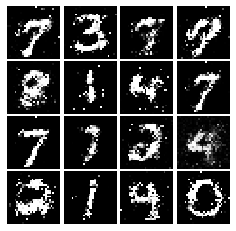

Epoch: 7, Iter: 3340, D: 0.206, G:0.1958


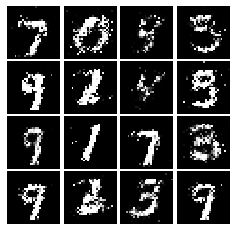

Epoch: 7, Iter: 3360, D: 0.2242, G:0.1853


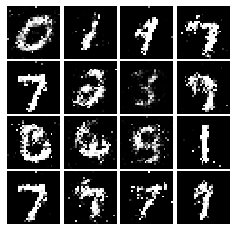

Epoch: 7, Iter: 3380, D: 0.2191, G:0.1764


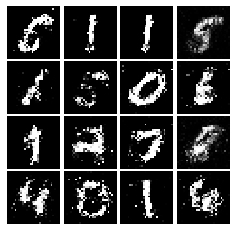

Epoch: 7, Iter: 3400, D: 0.2437, G:0.1671


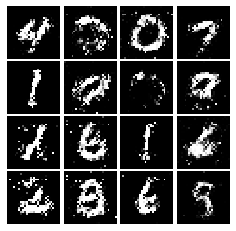

Epoch: 7, Iter: 3420, D: 0.2128, G:0.1985


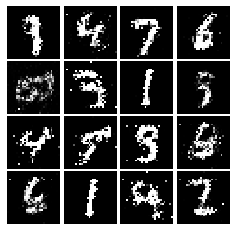

Epoch: 7, Iter: 3440, D: 0.2185, G:0.1803


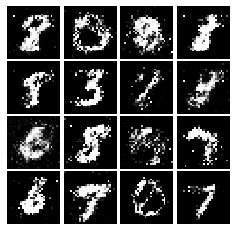

Epoch: 7, Iter: 3460, D: 0.2021, G:0.1919


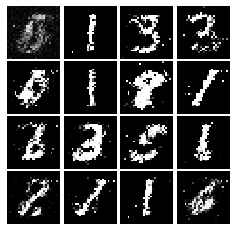

Epoch: 7, Iter: 3480, D: 0.224, G:0.1693


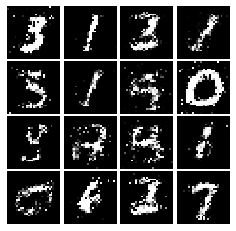

Epoch: 7, Iter: 3500, D: 0.2296, G:0.175


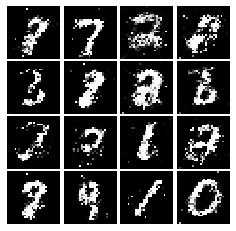

Epoch: 7, Iter: 3520, D: 0.249, G:0.1958


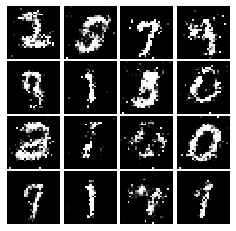

Epoch: 7, Iter: 3540, D: 0.2115, G:0.1665


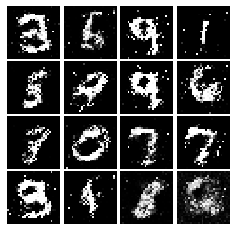

Epoch: 7, Iter: 3560, D: 0.2076, G:0.199


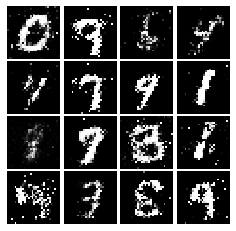

Epoch: 7, Iter: 3580, D: 0.2181, G:0.1593


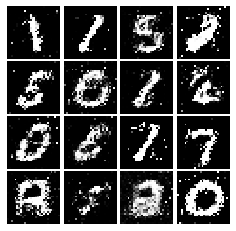

Epoch: 7, Iter: 3600, D: 0.2209, G:0.1744


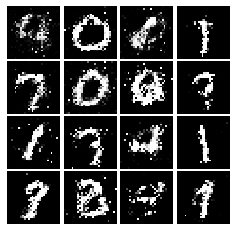

Epoch: 7, Iter: 3620, D: 0.2014, G:0.1779


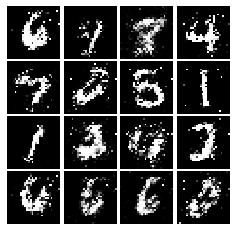

Epoch: 7, Iter: 3640, D: 0.2329, G:0.1706


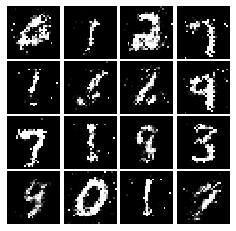

Epoch: 7, Iter: 3660, D: 0.2088, G:0.1934


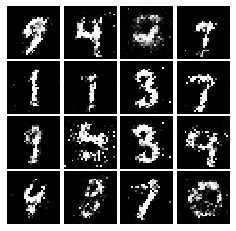

Epoch: 7, Iter: 3680, D: 0.2345, G:0.161


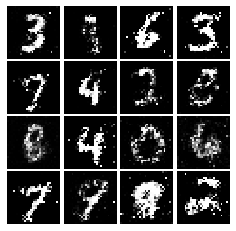

Epoch: 7, Iter: 3700, D: 0.2327, G:0.1731


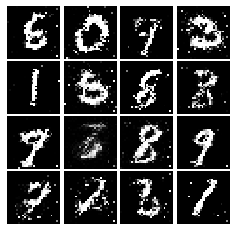

Epoch: 7, Iter: 3720, D: 0.2111, G:0.1689


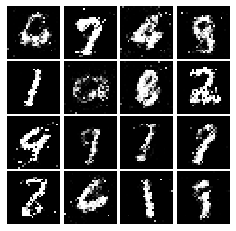

Epoch: 7, Iter: 3740, D: 0.2382, G:0.1587


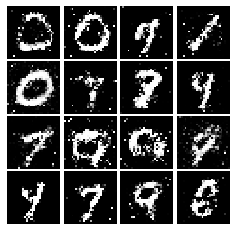

Epoch: 8, Iter: 3760, D: 0.2269, G:0.1777


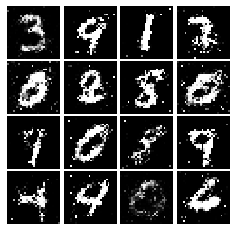

Epoch: 8, Iter: 3780, D: 0.2216, G:0.1636


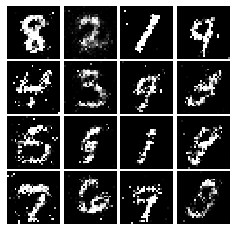

Epoch: 8, Iter: 3800, D: 0.2211, G:0.1765


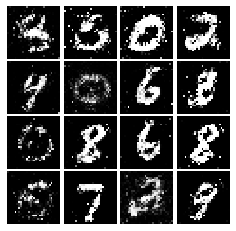

Epoch: 8, Iter: 3820, D: 0.2155, G:0.1757


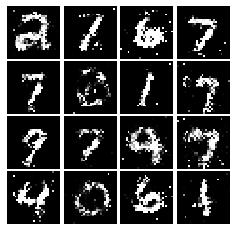

Epoch: 8, Iter: 3840, D: 0.2229, G:0.1876


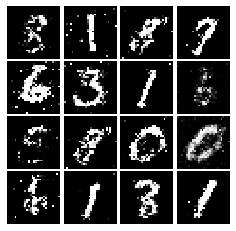

Epoch: 8, Iter: 3860, D: 0.2343, G:0.1643


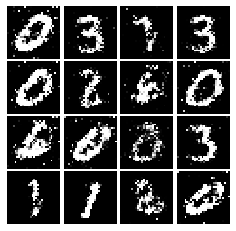

Epoch: 8, Iter: 3880, D: 0.2263, G:0.1765


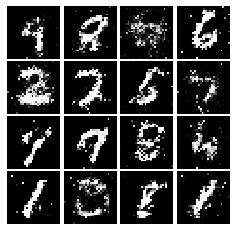

Epoch: 8, Iter: 3900, D: 0.2335, G:0.155


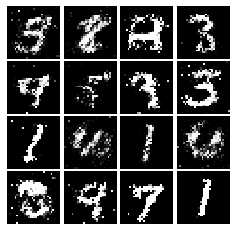

Epoch: 8, Iter: 3920, D: 0.2243, G:0.1596


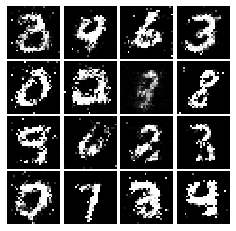

Epoch: 8, Iter: 3940, D: 0.2314, G:0.1559


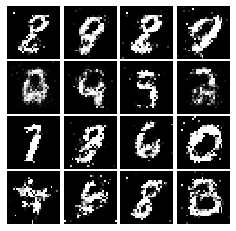

Epoch: 8, Iter: 3960, D: 0.2281, G:0.1413


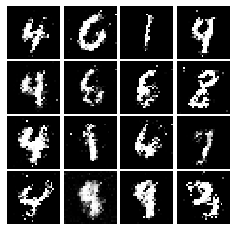

Epoch: 8, Iter: 3980, D: 0.2548, G:0.1665


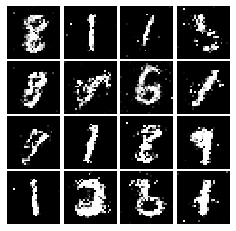

Epoch: 8, Iter: 4000, D: 0.2003, G:0.1781


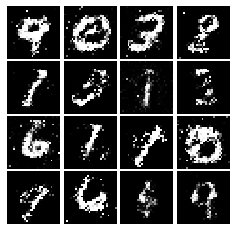

Epoch: 8, Iter: 4020, D: 0.2355, G:0.1603


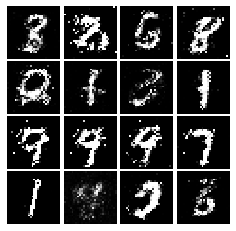

Epoch: 8, Iter: 4040, D: 0.2201, G:0.1836


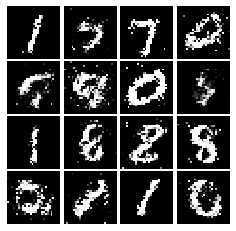

Epoch: 8, Iter: 4060, D: 0.2159, G:0.1523


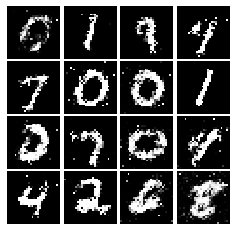

Epoch: 8, Iter: 4080, D: 0.247, G:0.1845


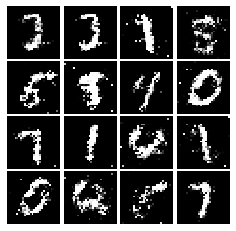

Epoch: 8, Iter: 4100, D: 0.2439, G:0.1816


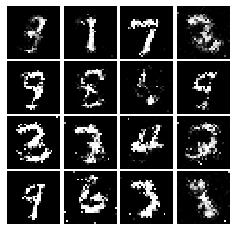

Epoch: 8, Iter: 4120, D: 0.2256, G:0.1741


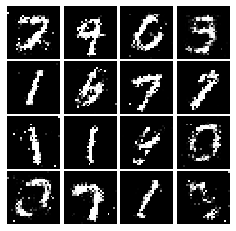

Epoch: 8, Iter: 4140, D: 0.2187, G:0.1709


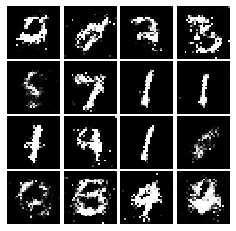

Epoch: 8, Iter: 4160, D: 0.2498, G:0.1882


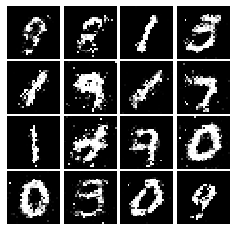

Epoch: 8, Iter: 4180, D: 0.2413, G:0.1695


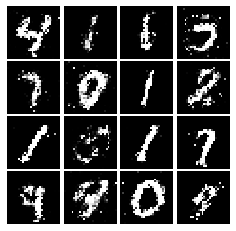

Epoch: 8, Iter: 4200, D: 0.2213, G:0.1768


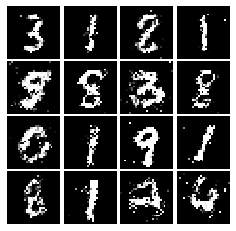

Epoch: 8, Iter: 4220, D: 0.2347, G:0.1773


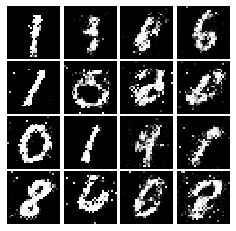

Epoch: 9, Iter: 4240, D: 0.259, G:0.1759


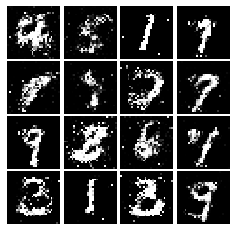

Epoch: 9, Iter: 4260, D: 0.2542, G:0.1687


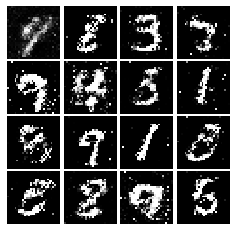

Epoch: 9, Iter: 4280, D: 0.2337, G:0.1628


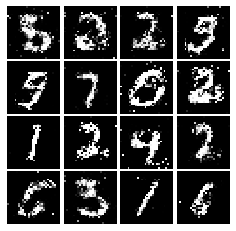

Epoch: 9, Iter: 4300, D: 0.2419, G:0.1663


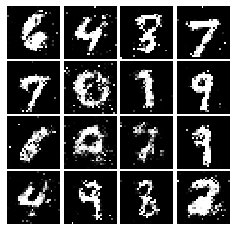

Epoch: 9, Iter: 4320, D: 0.2468, G:0.1525


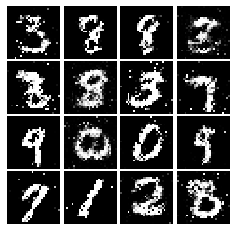

Epoch: 9, Iter: 4340, D: 0.2504, G:0.1523


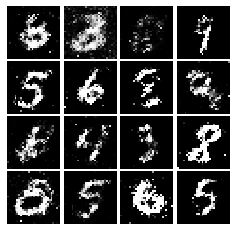

Epoch: 9, Iter: 4360, D: 0.2646, G:0.1536


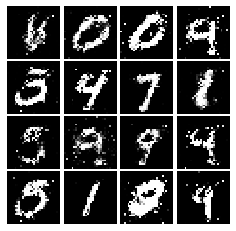

Epoch: 9, Iter: 4380, D: 0.2428, G:0.1457


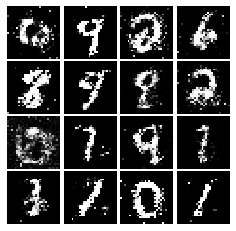

Epoch: 9, Iter: 4400, D: 0.214, G:0.1528


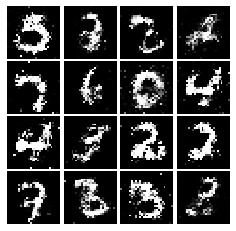

Epoch: 9, Iter: 4420, D: 0.2283, G:0.1477


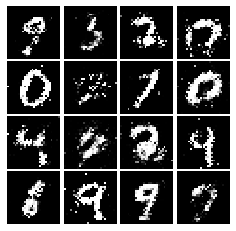

Epoch: 9, Iter: 4440, D: 0.2433, G:0.1368


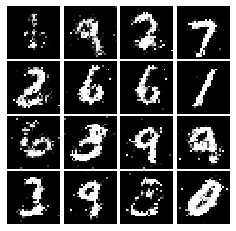

Epoch: 9, Iter: 4460, D: 0.2345, G:0.1386


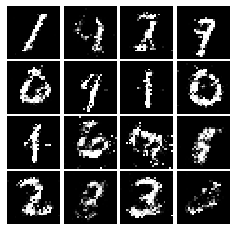

Epoch: 9, Iter: 4480, D: 0.2236, G:0.1763


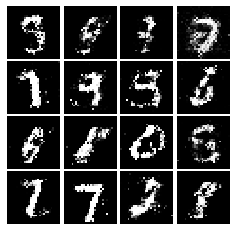

Epoch: 9, Iter: 4500, D: 0.2579, G:0.1445


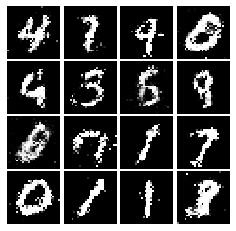

Epoch: 9, Iter: 4520, D: 0.2379, G:0.1765


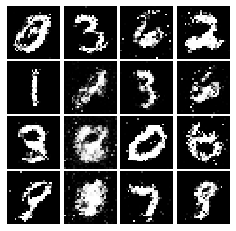

Epoch: 9, Iter: 4540, D: 0.2389, G:0.1857


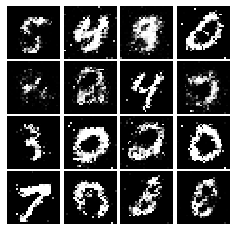

Epoch: 9, Iter: 4560, D: 0.236, G:0.1674


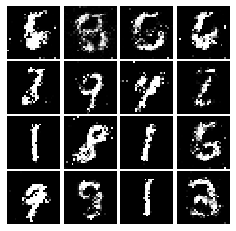

Epoch: 9, Iter: 4580, D: 0.2664, G:0.1476


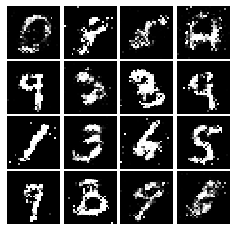

Epoch: 9, Iter: 4600, D: 0.2396, G:0.1473


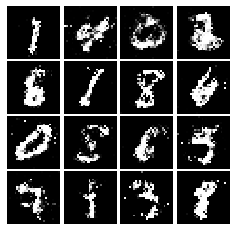

Epoch: 9, Iter: 4620, D: 0.2287, G:0.1598


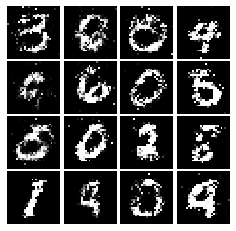

Epoch: 9, Iter: 4640, D: 0.2311, G:0.1495


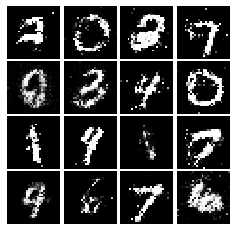

Epoch: 9, Iter: 4660, D: 0.2508, G:0.1559


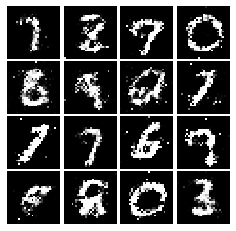

Epoch: 9, Iter: 4680, D: 0.2472, G:0.1607


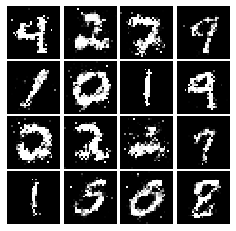

Final images


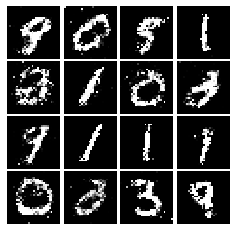

In [213]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [214]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.InputLayer(784),
        tf.keras.layers.Reshape((28, 28, 1)),
        tf.keras.layers.Conv2D(32, kernel_size=(5, 5), strides=(1,1), padding="VALID", use_bias=True),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.MaxPool2D((2, 2), strides=(2, 2)),
        tf.keras.layers.Conv2D(64, kernel_size=(5, 5), strides=(1,1), padding="VALID", use_bias=True),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.MaxPool2D((2, 2), strides=(2, 2)),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4 * 4 * 64, use_bias=True),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(1, use_bias=True)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [215]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        
        tf.keras.layers.Dense(1024, input_shape=(noise_dim,), use_bias=True, activation="relu"),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(7*7*128, use_bias=True, activation="relu"),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Reshape((7, 7, 128)),
        tf.keras.layers.Conv2DTranspose(64, kernel_size=(4,4), strides=2, use_bias=True, padding='SAME', activation="relu"),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2DTranspose(1, kernel_size=(4,4), strides=2, use_bias=True, padding='SAME', activation="tanh")
    ])
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.418, G:0.6553


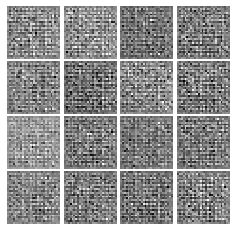

Epoch: 0, Iter: 20, D: 0.597, G:0.9182


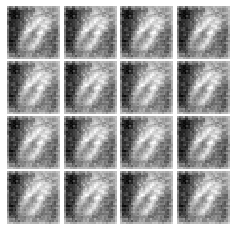

Epoch: 0, Iter: 40, D: 0.1128, G:2.652


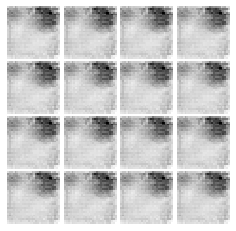

Epoch: 0, Iter: 60, D: 0.1649, G:2.778


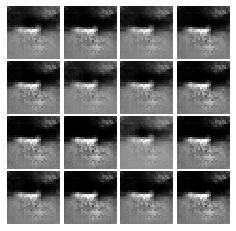

Epoch: 0, Iter: 80, D: 0.6389, G:1.771


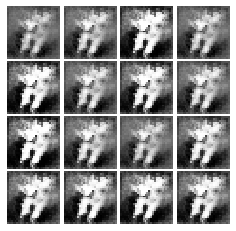

Epoch: 0, Iter: 100, D: 0.5435, G:2.361


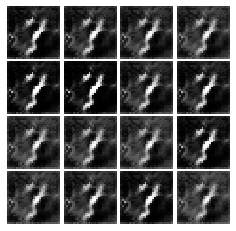

Epoch: 0, Iter: 120, D: 0.6283, G:2.565


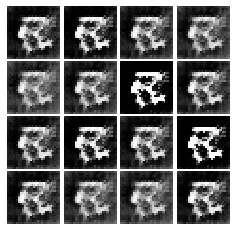

Epoch: 0, Iter: 140, D: 0.4996, G:2.721


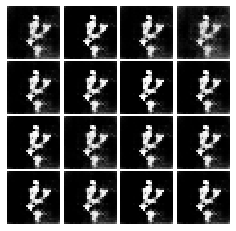

Epoch: 0, Iter: 160, D: 0.2241, G:3.786


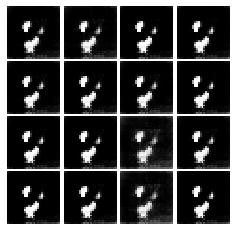

Epoch: 0, Iter: 180, D: 0.9062, G:1.418


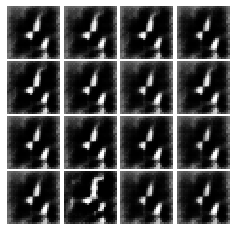

Epoch: 0, Iter: 200, D: 0.9184, G:2.197


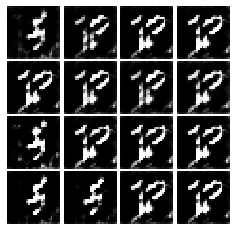

Epoch: 0, Iter: 220, D: 1.634, G:1.896


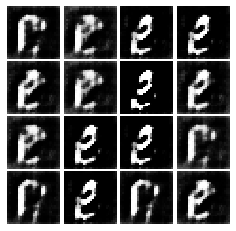

Epoch: 0, Iter: 240, D: 0.5222, G:4.734


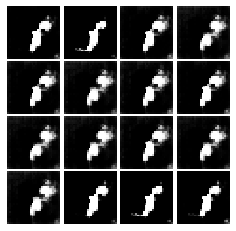

Epoch: 0, Iter: 260, D: 1.111, G:2.474


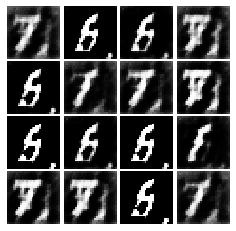

Epoch: 0, Iter: 280, D: 0.8406, G:2.49


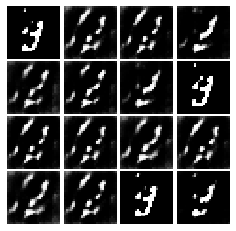

Epoch: 0, Iter: 300, D: 0.8188, G:3.944


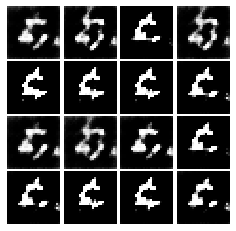

Epoch: 0, Iter: 320, D: 0.4773, G:2.412


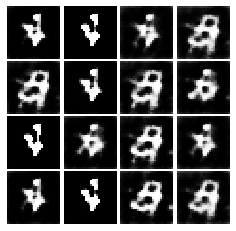

Epoch: 0, Iter: 340, D: 0.1992, G:3.942


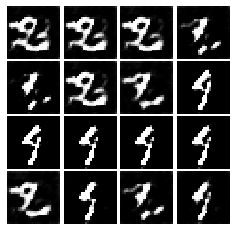

Epoch: 0, Iter: 360, D: 0.3676, G:3.245


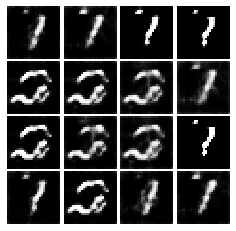

Epoch: 0, Iter: 380, D: 0.483, G:3.335


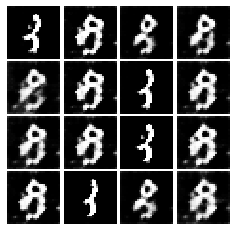

Epoch: 0, Iter: 400, D: 0.9576, G:1.722


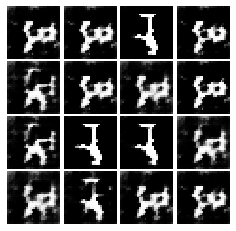

Epoch: 0, Iter: 420, D: 0.6769, G:2.478


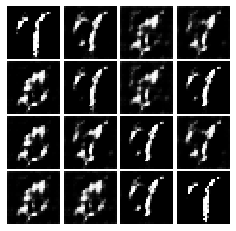

Epoch: 0, Iter: 440, D: 0.4781, G:2.667


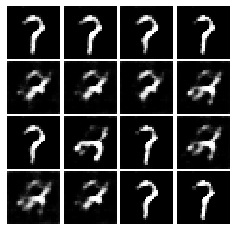

Epoch: 0, Iter: 460, D: 0.2725, G:5.272


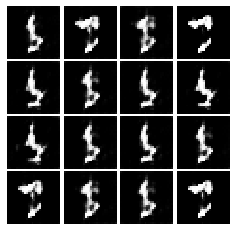

Epoch: 1, Iter: 480, D: 0.2549, G:4.519


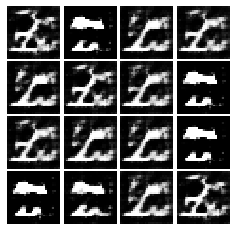

Epoch: 1, Iter: 500, D: 0.3463, G:3.27


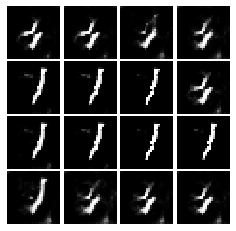

Epoch: 1, Iter: 520, D: 0.1557, G:3.929


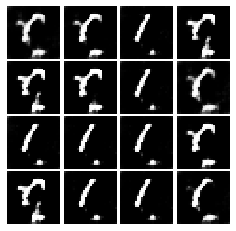

Epoch: 1, Iter: 540, D: 0.9226, G:1.076


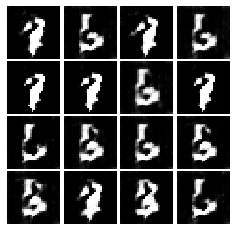

Epoch: 1, Iter: 560, D: 1.774, G:10.35


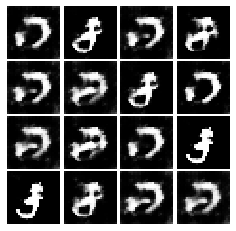

Epoch: 1, Iter: 580, D: 0.911, G:4.233


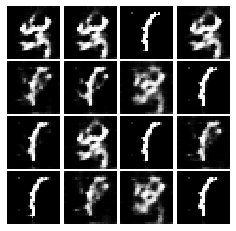

Epoch: 1, Iter: 600, D: 1.366, G:6.101


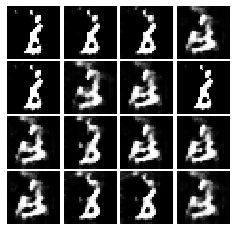

Epoch: 1, Iter: 620, D: 0.4411, G:3.854


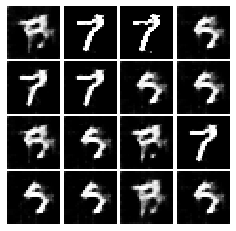

Epoch: 1, Iter: 640, D: 0.4856, G:3.73


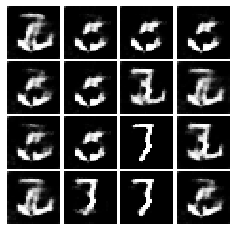

Epoch: 1, Iter: 660, D: 0.5568, G:2.601


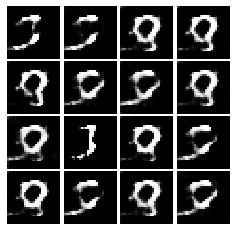

Epoch: 1, Iter: 680, D: 0.6532, G:2.916


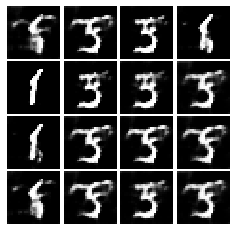

Epoch: 1, Iter: 700, D: 0.6228, G:2.705


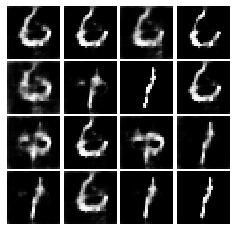

Epoch: 1, Iter: 720, D: 0.4747, G:2.659


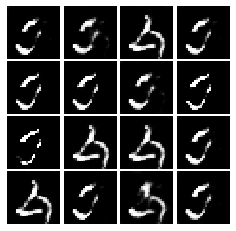

Epoch: 1, Iter: 740, D: 0.4121, G:4.255


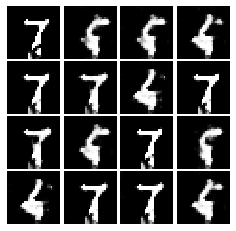

Epoch: 1, Iter: 760, D: 0.3027, G:5.697


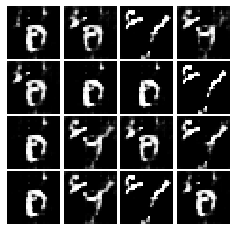

Epoch: 1, Iter: 780, D: 0.1244, G:3.851


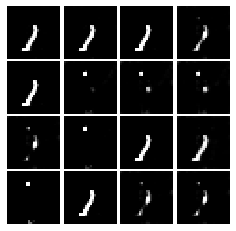

Epoch: 1, Iter: 800, D: 0.3333, G:3.485


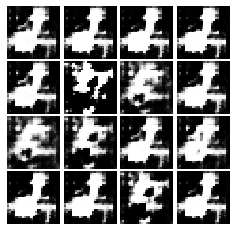

Epoch: 1, Iter: 820, D: 0.1556, G:3.249


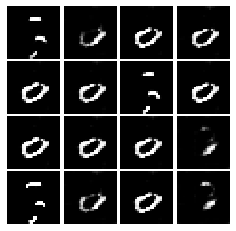

Epoch: 1, Iter: 840, D: 0.3421, G:3.803


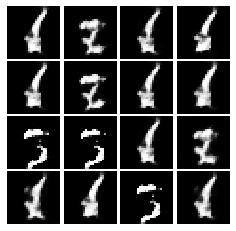

Epoch: 1, Iter: 860, D: 0.6982, G:2.537


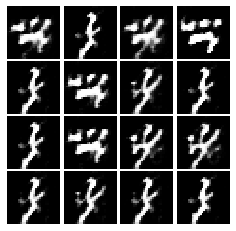

Epoch: 1, Iter: 880, D: 0.472, G:5.187


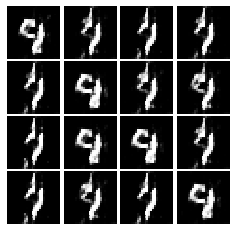

Epoch: 1, Iter: 900, D: 0.4524, G:2.41


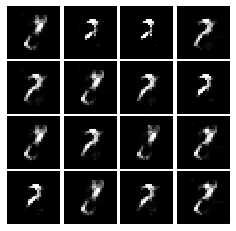

Epoch: 1, Iter: 920, D: 0.6515, G:8.899


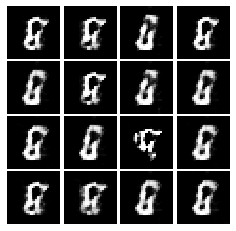

Epoch: 2, Iter: 940, D: 0.5598, G:4.334


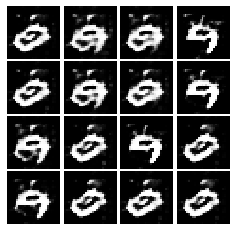

Epoch: 2, Iter: 960, D: 0.336, G:3.401


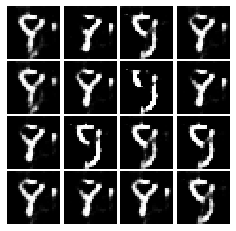

Epoch: 2, Iter: 980, D: 0.4521, G:2.661


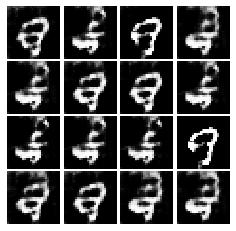

Epoch: 2, Iter: 1000, D: 1.054, G:6.605


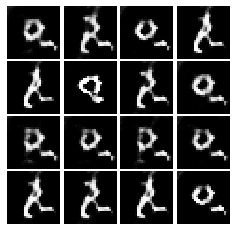

Epoch: 2, Iter: 1020, D: 0.6571, G:2.336


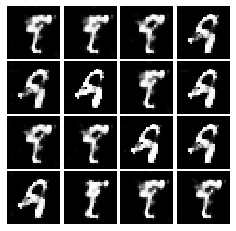

Epoch: 2, Iter: 1040, D: 0.1654, G:3.588


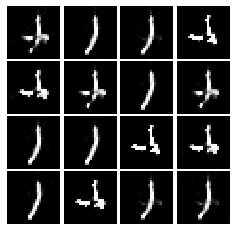

Epoch: 2, Iter: 1060, D: 0.1603, G:4.307


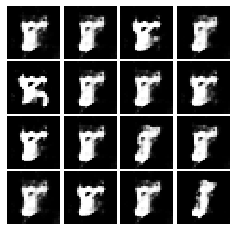

Epoch: 2, Iter: 1080, D: 0.1927, G:5.207


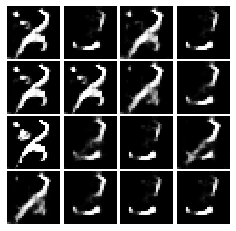

Epoch: 2, Iter: 1100, D: 0.2464, G:3.26


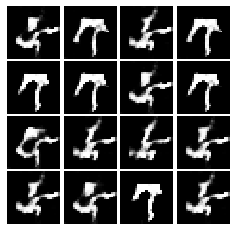

Epoch: 2, Iter: 1120, D: 0.1921, G:3.251


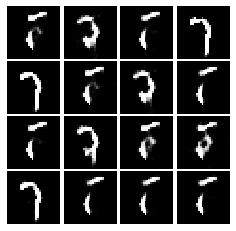

Epoch: 2, Iter: 1140, D: 0.3031, G:4.21


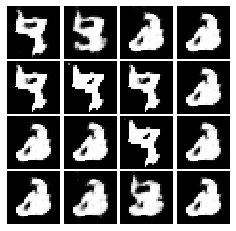

Epoch: 2, Iter: 1160, D: 0.3004, G:8.734


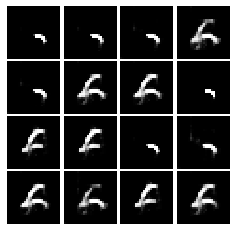

Epoch: 2, Iter: 1180, D: 0.8096, G:3.802


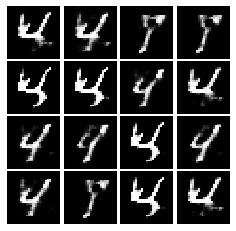

Epoch: 2, Iter: 1200, D: 0.3076, G:2.476


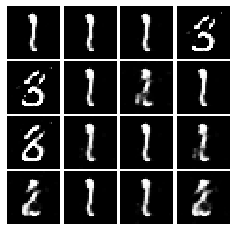

Epoch: 2, Iter: 1220, D: 0.4739, G:2.892


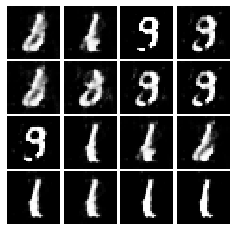

Epoch: 2, Iter: 1240, D: 0.3536, G:3.12


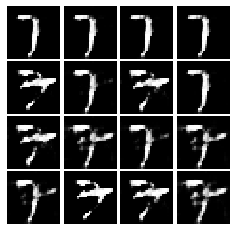

Epoch: 2, Iter: 1260, D: 0.2976, G:4.017


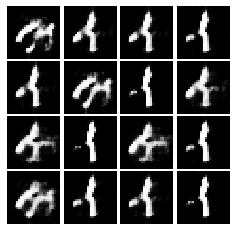

Epoch: 2, Iter: 1280, D: 0.3615, G:2.295


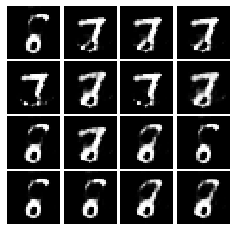

Epoch: 2, Iter: 1300, D: 1.22, G:5.904


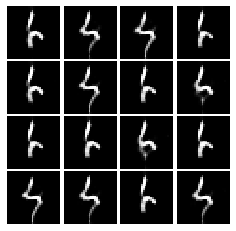

Epoch: 2, Iter: 1320, D: 0.3102, G:3.902


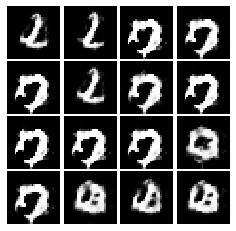

Epoch: 2, Iter: 1340, D: 0.2107, G:3.338


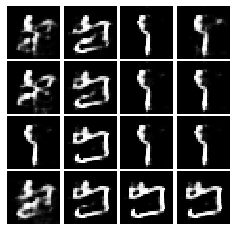

Epoch: 2, Iter: 1360, D: 0.5037, G:2.532


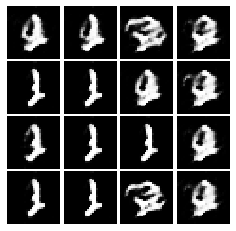

Epoch: 2, Iter: 1380, D: 0.5663, G:3.782


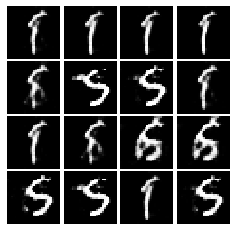

Epoch: 2, Iter: 1400, D: 0.1853, G:3.349


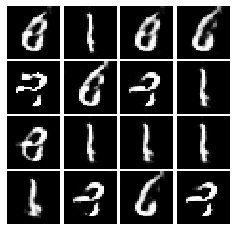

Epoch: 3, Iter: 1420, D: 0.3121, G:4.414


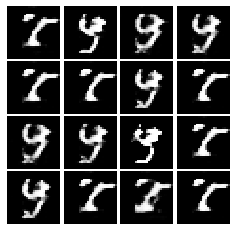

Epoch: 3, Iter: 1440, D: 0.2466, G:4.746


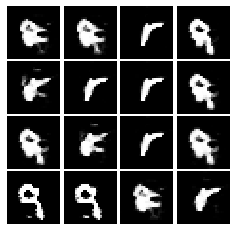

Epoch: 3, Iter: 1460, D: 1.114, G:3.192


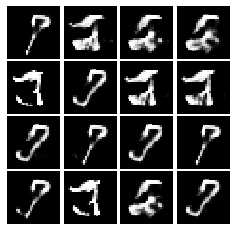

Epoch: 3, Iter: 1480, D: 0.5326, G:7.035


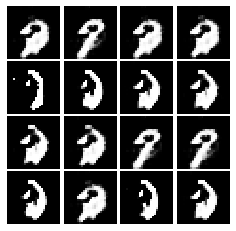

Epoch: 3, Iter: 1500, D: 0.3087, G:4.192


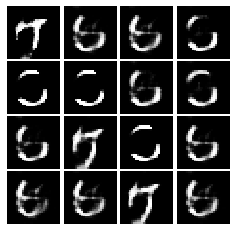

Epoch: 3, Iter: 1520, D: 0.4459, G:3.617


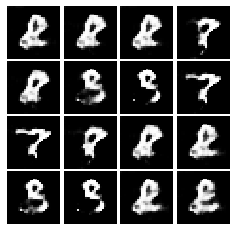

Epoch: 3, Iter: 1540, D: 0.4995, G:3.801


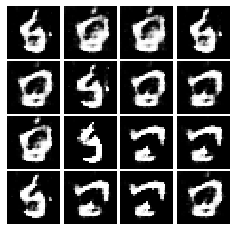

Epoch: 3, Iter: 1560, D: 0.2232, G:3.498


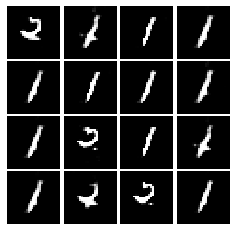

Epoch: 3, Iter: 1580, D: 0.1514, G:4.876


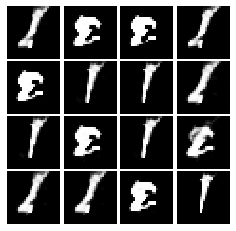

Epoch: 3, Iter: 1600, D: 0.6528, G:3.011


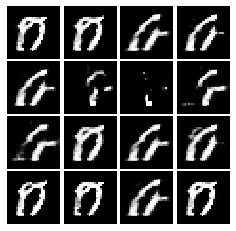

Epoch: 3, Iter: 1620, D: 0.6158, G:8.466


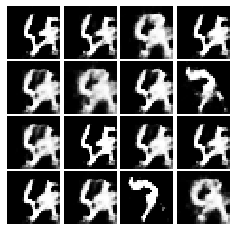

Epoch: 3, Iter: 1640, D: 0.4434, G:4.43


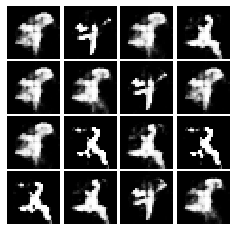

Epoch: 3, Iter: 1660, D: 0.5746, G:4.816


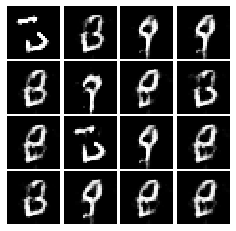

Epoch: 3, Iter: 1680, D: 0.1428, G:3.706


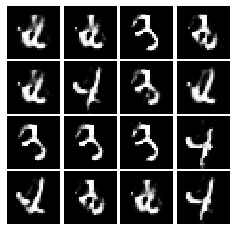

Epoch: 3, Iter: 1700, D: 0.4498, G:3.525


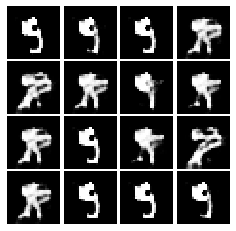

Epoch: 3, Iter: 1720, D: 0.09929, G:7.703


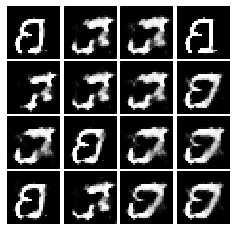

Epoch: 3, Iter: 1740, D: 0.8718, G:9.642


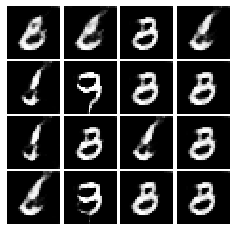

Epoch: 3, Iter: 1760, D: 0.4231, G:4.78


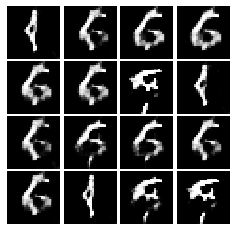

Epoch: 3, Iter: 1780, D: 0.7621, G:6.765


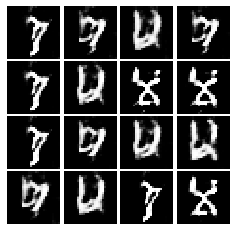

Epoch: 3, Iter: 1800, D: 0.5064, G:2.481


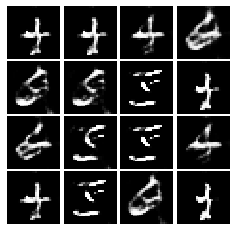

Epoch: 3, Iter: 1820, D: 0.3121, G:3.016


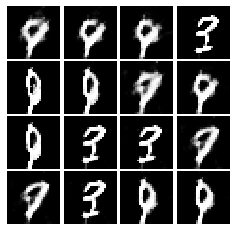

Epoch: 3, Iter: 1840, D: 0.3585, G:4.924


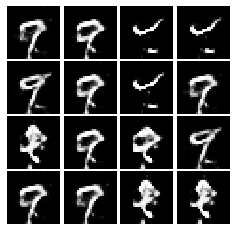

Epoch: 3, Iter: 1860, D: 0.2655, G:2.927


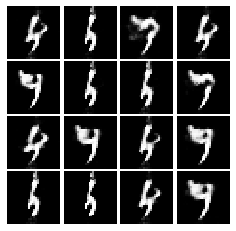

Epoch: 4, Iter: 1880, D: 0.3029, G:4.388


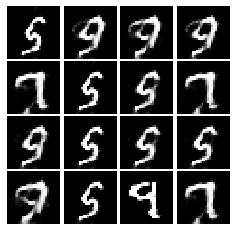

Epoch: 4, Iter: 1900, D: 0.3936, G:3.37


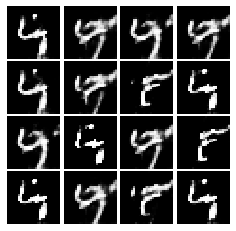

Epoch: 4, Iter: 1920, D: 0.202, G:5.213


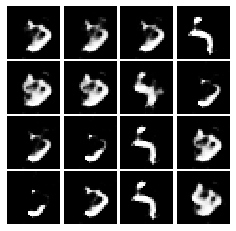

Epoch: 4, Iter: 1940, D: 0.169, G:4.079


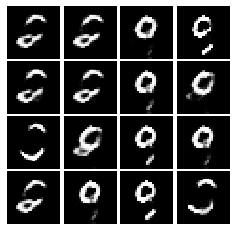

Epoch: 4, Iter: 1960, D: 0.2475, G:3.578


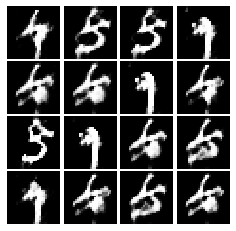

Epoch: 4, Iter: 1980, D: 0.5083, G:3.735


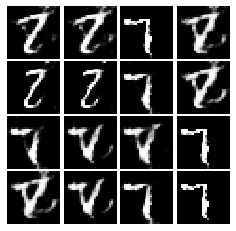

Epoch: 4, Iter: 2000, D: 0.1887, G:3.423


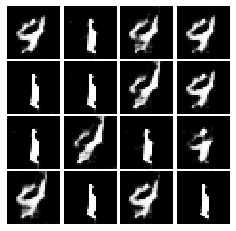

Epoch: 4, Iter: 2020, D: 0.4018, G:3.735


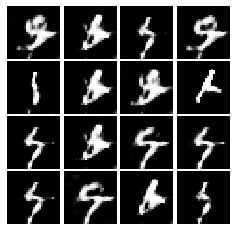

Epoch: 4, Iter: 2040, D: 0.698, G:5.803


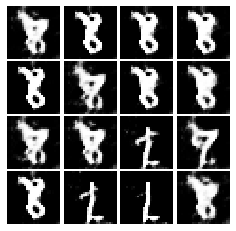

Epoch: 4, Iter: 2060, D: 0.3699, G:4.249


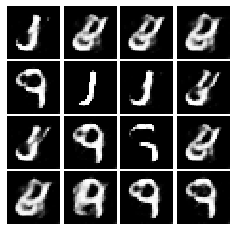

Epoch: 4, Iter: 2080, D: 0.2959, G:3.379


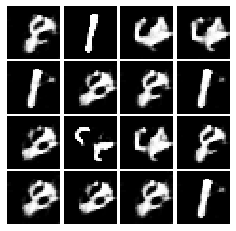

Epoch: 4, Iter: 2100, D: 0.1182, G:4.563


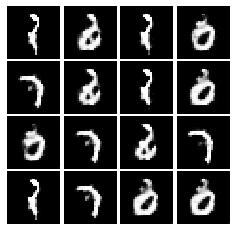

Epoch: 4, Iter: 2120, D: 0.2193, G:4.615


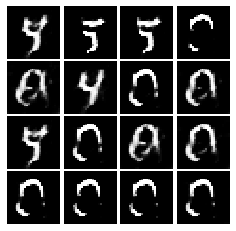

Epoch: 4, Iter: 2140, D: 0.2419, G:4.216


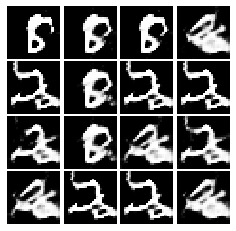

Epoch: 4, Iter: 2160, D: 0.3068, G:3.27


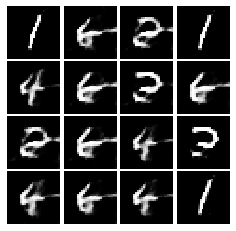

Epoch: 4, Iter: 2180, D: 0.2364, G:3.329


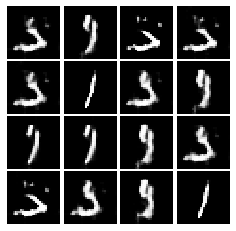

Epoch: 4, Iter: 2200, D: 0.4201, G:6.232


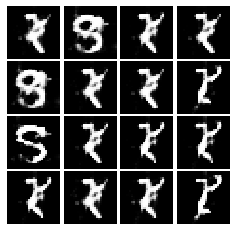

Epoch: 4, Iter: 2220, D: 0.2239, G:3.966


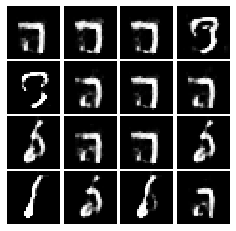

Epoch: 4, Iter: 2240, D: 0.2547, G:3.608


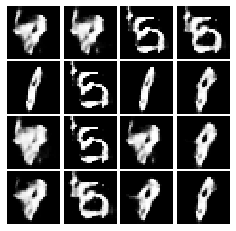

Epoch: 4, Iter: 2260, D: 0.6088, G:6.038


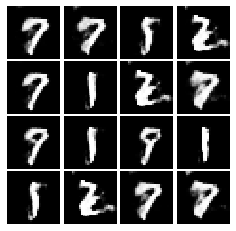

Epoch: 4, Iter: 2280, D: 0.2, G:4.146


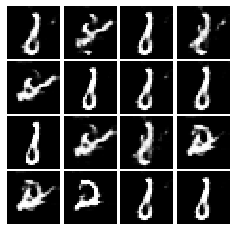

Epoch: 4, Iter: 2300, D: 0.6425, G:4.97


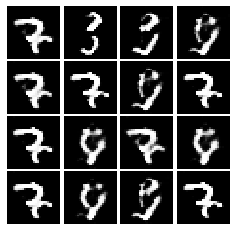

Epoch: 4, Iter: 2320, D: 0.1975, G:4.601


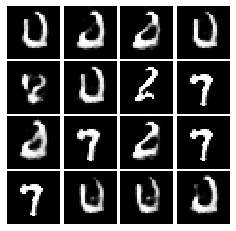

Epoch: 4, Iter: 2340, D: 3.168, G:2.286


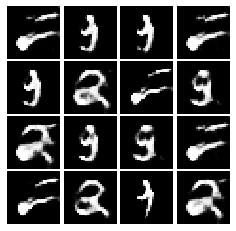

Final images


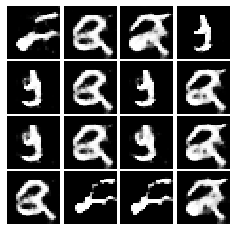

In [216]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |       |       |       |       |       |       
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |       |       |       |       |       |       
   


In [155]:
def f_forward(x, y):
    out = x * y
    cache = (x, y)
    return out, cache

def f_backward(cache):
    x, y = cache
    dx = y
    dy = x
    return dx, dy

def train():
    x, y = 1, 1
    lr = 1
    for i in range(7):
        out, cache = f_forward(x, y)
        print('In step %d, x is %d, y is %d, out is %d.' %(i, x, y, out))
        
        dx, dy = f_backward(cache)
        x -= lr * dx
        out, cache = f_forward(x, y)
        print('updating x = %d, out is %d.' %(x, out))
        
        dx, dy = f_backward(cache)
        y += lr * dy
        out, cache = f_forward(x, y)
        print('updating y = %d, out is %d.' %(y, out))
        
train()

In step 0, x is 1, y is 1, out is 1.
updating x = 0, out is 0.
updating y = 1, out is 0.
In step 1, x is 0, y is 1, out is 0.
updating x = -1, out is -1.
updating y = 0, out is 0.
In step 2, x is -1, y is 0, out is 0.
updating x = -1, out is 0.
updating y = -1, out is 1.
In step 3, x is -1, y is -1, out is 1.
updating x = 0, out is 0.
updating y = -1, out is 0.
In step 4, x is 0, y is -1, out is 0.
updating x = 1, out is -1.
updating y = 0, out is 0.
In step 5, x is 1, y is 0, out is 0.
updating x = 1, out is 0.
updating y = 1, out is 1.
In step 6, x is 1, y is 1, out is 1.
updating x = 0, out is 0.
updating y = 1, out is 0.


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 

No, because the min and max forces pull towards each other.

## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 

No, if the generator loss decreases, it means higher capacity to fool discriminator. However, if the discriminator loss stays the same, it could imply a very weak discriminator which even might not tell the difference between real and fake images. 